# Machine Learning Apps Project

## Fraudulent and Non fraudulent classification of job postings

#### Names:

- Yago Riudavets García 

- Ricardo Vázquez Álvarez

- Carlos Casanova Romero

Importing the libraries needed for NLP, plotting and numerical problem solving.

In [2]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import seaborn as sns

import spacy
from spacy.lang.en.stop_words import STOP_WORDS
from spacy.lang.en import English
from termcolor import colored

In [102]:
# Reading the csv file
df_raw = pd.read_csv("fake_job_postings.csv")
df = df_raw.copy(deep=True)

### Exploratoy Data Analysis

In this part of the project we plan on exploring our data set through the use of graphs and seeing how the features represent our classes.

In [104]:
# Seeing a part of the data.
df.head()

,job_id,title,location,department,salary_range,company_profile,description,requirements,benefits,telecommuting,has_company_logo,has_questions,employment_type,required_experience,required_education,industry,function,fraudulent
0,1,Marketing Intern,"US, NY, New York",Marketing,NaN,"We're Food52, and we've created a groundbreaki...","Food52, a fast-growing, James Beard Award-winn...",Experience with content management systems a m...,NaN,0,1,0,Other,Internship,NaN,NaN,Marketing,0
1,2,Customer Service - Cloud Video Production,"NZ, , Auckland",Success,NaN,"90 Seconds, the worlds Cloud Video Production ...",Organised - Focused - Vibrant - Awesome!Do you...,What we expect from you:Your key responsibilit...,What you will get from usThrough being part of...,0,1,0,Full-time,Not Applicable,NaN,Marketing and Advertising,Customer Service,0
2,3,Commissioning Machinery Assistant (CMA),"US, IA, Wever",NaN,NaN,Valor Services provides Workforce Solutions th...,"Our client, located in Houston, is actively se...",Implement pre-commissioning and commissioning ...,NaN,0,1,0,NaN,NaN,NaN,NaN,NaN,0
3,4,Account Executive - Washington DC,"US, DC, Washington",Sales,NaN,Our passion for improving quality of life thro...,THE COMPANY: ESRI – Environmental Systems Rese...,"EDUCATION: Bachelor’s or Master’s in GIS, busi...",Our culture is anything but corporate—we have ...,0,1,0,Full-time,Mid-Senior level,Bachelor's Degree,Computer Software,Sales,0
4,5,Bill Review Manager,"US, FL, Fort Worth",NaN,NaN,SpotSource Solutions LLC is a Global Human Cap...,JOB TITLE: Itemization Review ManagerLOCATION:...,QUALIFICATIONS:RN license in the State of Texa...,Full Benefits Offered,0,1,1,Full-time,Mid-Senior level,Bachelor's Degree,Hospital & Health Care,Health Care Provider,0


In [103]:
df.shape

(17880, 18)

Heat map of the NAs in our data for clear visualization of the missing data.

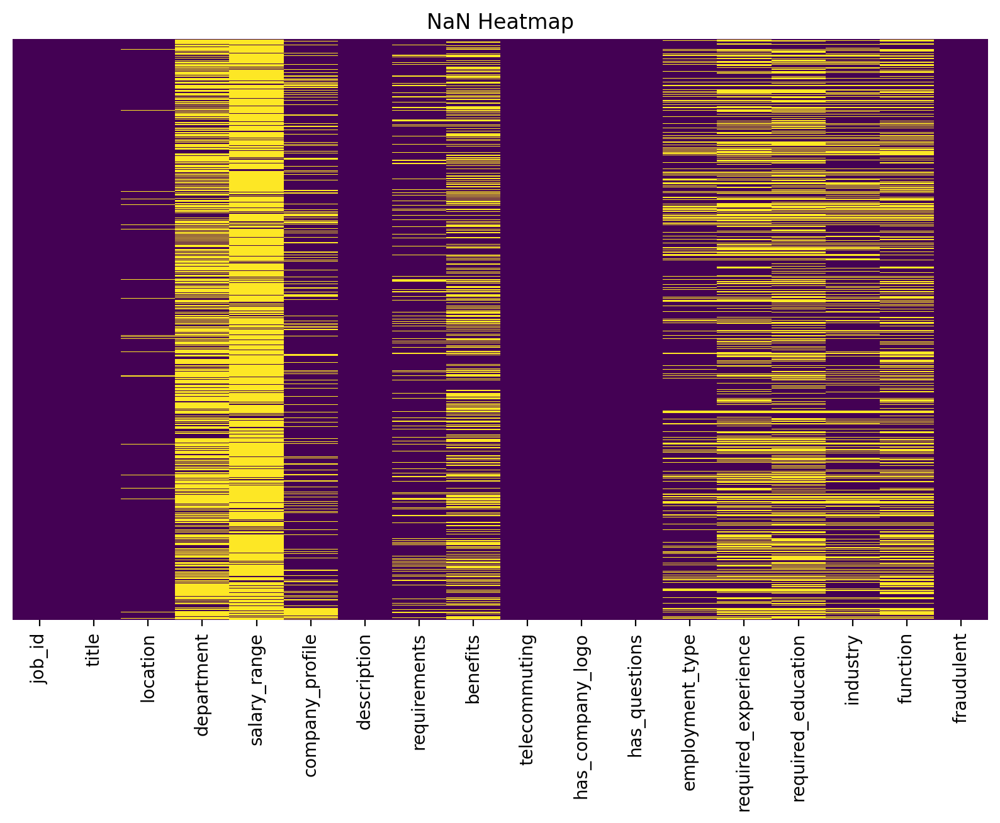

In [105]:
plt.figure(figsize=(10, 6))
sns.heatmap(df.isna(), cbar=False, yticklabels=False, cmap='viridis')
plt.title('NaN Heatmap')
plt.show()

Fraudulent class to predict in clearly unbalanced

Text(0.5, 1.0, 'Real Fake Jobs')

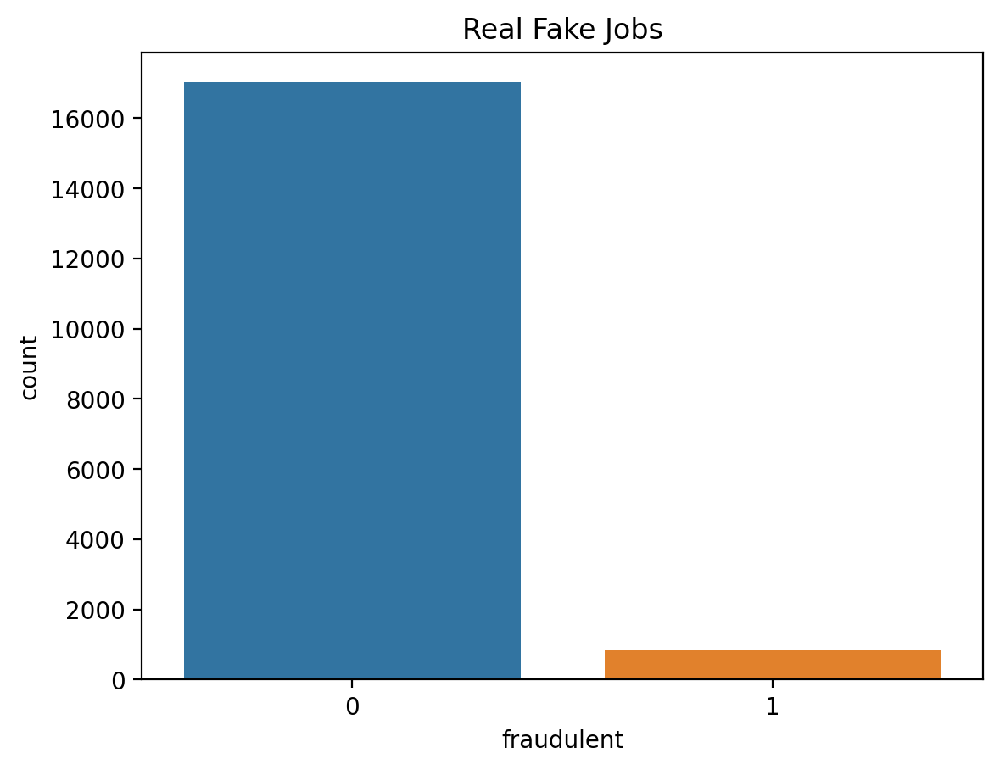

In [106]:
sns.countplot(x='fraudulent', data=df)
plt.title('Real Fake Jobs')

Separate location to get `country`

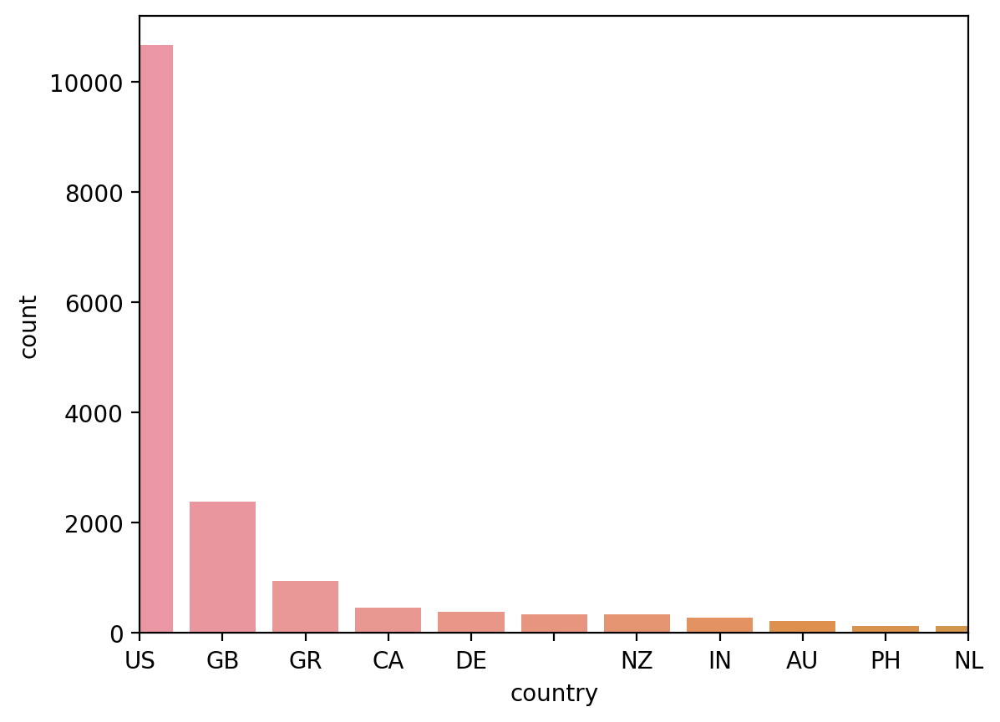

In [107]:
def split(location):
    l = location.split(',')
    return l[0]

df.fillna(' ', inplace=True)
df['country'] = df['location'].apply(split)

order = df['country'].value_counts().index
ax = sns.countplot(x = "country", data = df, order = order)
ax.set_xlim(0, 10)
plt.show()

Exploring other columns and their effects on the Binary variable (fraudulent).

In [108]:
# For encoding categorical variables in to numerical levels.
from sklearn.preprocessing import LabelEncoder

Beginning with the `required_experience` column, we want to see the distinction between fraudulent and non fraudulent.

- There is a clear difference in the distribution of the data for fraudulent and non fraudulent. Our data is clearly suffering from class imbalance.

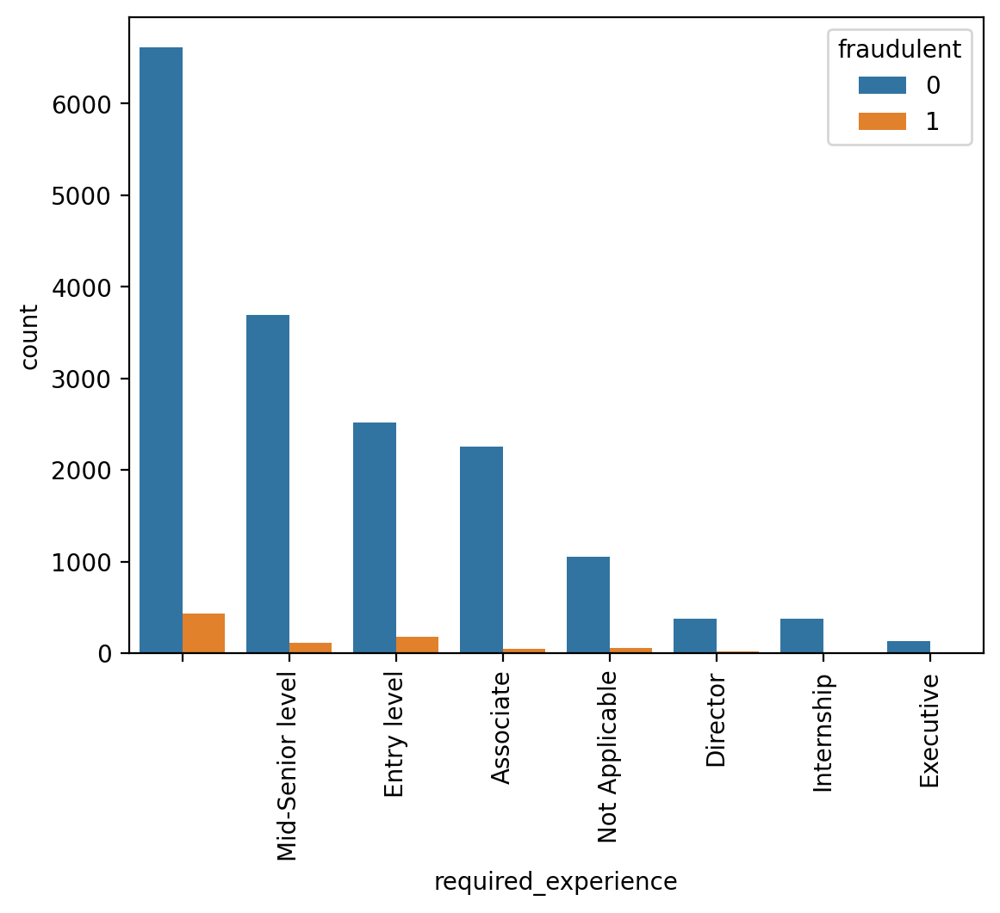

In [109]:
# Using seaborn to get the plot
# Getting the value counts (to order them appropriately)
order_exp = df['required_experience'].value_counts().index
ax = sns.countplot(x = "required_experience", data = df, order = order_exp, hue='fraudulent')
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
plt.show()

Note how there is are rows that are just empty spaces. Most of the fraudulent cases are with the spaces. We should change this to Not Applicable which already exists.

In [110]:
# The values are empty or NaN
df['required_experience'].replace('NaN', np.nan, inplace=True)
df['required_experience'] = df['required_experience'].fillna('Not Applicable')
df['required_experience'].replace(' ', 'Not Applicable', inplace=True)

# Fitting a label encoder to the column
le=LabelEncoder()
df['required_experience'] = le.fit_transform(df['required_experience'])
df['required_experience'].unique()

# printing the label mappings
label_mapping = {index: label for index, label in enumerate(le.classes_)}
print(label_mapping)
# label is 6 for the Not Applicable.

{0: 'Associate', 1: 'Director', 2: 'Entry level', 3: 'Executive', 4: 'Internship', 5: 'Mid-Senior level', 6: 'Not Applicable'}


C:\Users\Ricardo\AppData\Local\Temp\ipykernel_9508\2779152434.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['required_experience'].replace('NaN', np.nan, inplace=True)
C:\Users\Ricardo\AppData\Local\Temp\ipykernel_9508\2779152434.py:4: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as 

Looking at the `required_education` column, we can see that there are also space value that we should fill in. This time we will do it with 'Unspecified'.

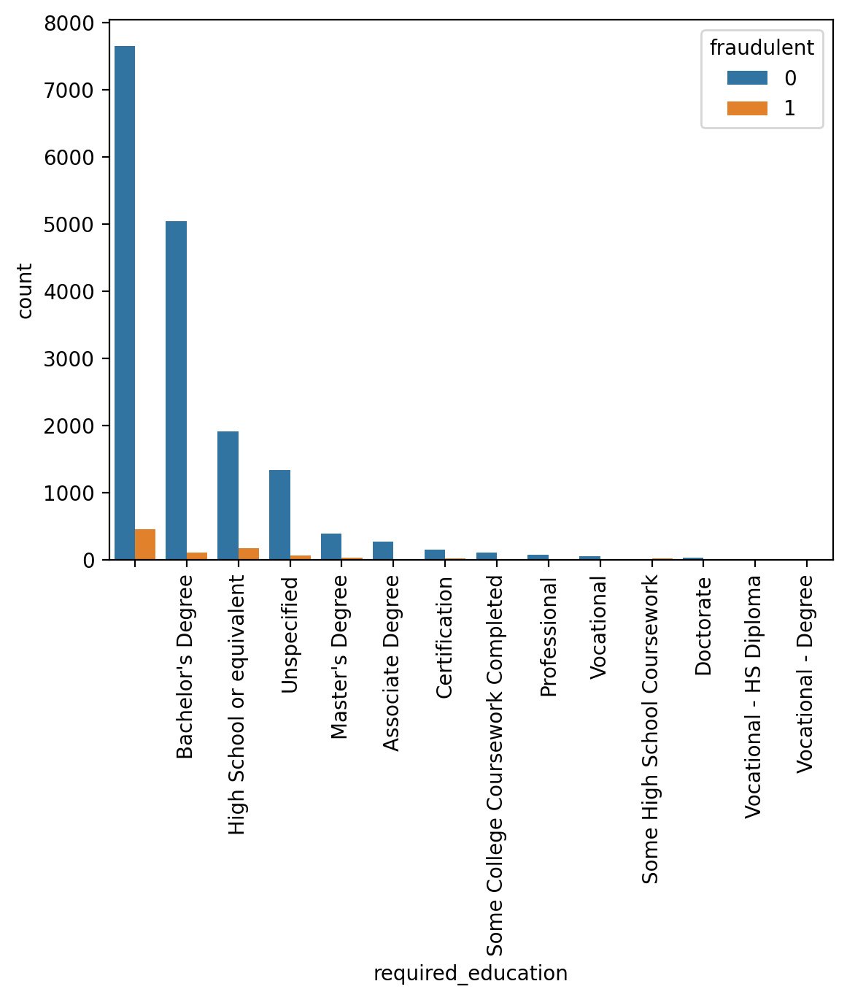

In [111]:
order_req = df['required_education'].value_counts().index
ax = sns.countplot(x = "required_education", data = df, order = order_req, hue = 'fraudulent')
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
# ax.set_xlim(0, 15)
plt.show()

Changing the space values to Unspecified and applying the encoding to this column.

In [112]:
df['required_education'].replace(' ', 'Unspecified', inplace=True)
print(df['required_education'].unique())

le_education=LabelEncoder()
df['required_education'] = le_education.fit_transform(df['required_education'])
print(df['required_education'].unique())
label_mapping_educ = {index: label for index, label in enumerate(le_education.classes_)}
print(label_mapping_educ)
# 9 is unspecified.

['Unspecified' "Bachelor's Degree" "Master's Degree"
 'High School or equivalent' 'Some College Coursework Completed'
 'Vocational' 'Certification' 'Associate Degree' 'Professional'
 'Doctorate' 'Some High School Coursework' 'Vocational - Degree'
 'Vocational - HS Diploma']
[ 9  1  5  4  7 10  2  0  6  3  8 11 12]
{0: 'Associate Degree', 1: "Bachelor's Degree", 2: 'Certification', 3: 'Doctorate', 4: 'High School or equivalent', 5: "Master's Degree", 6: 'Professional', 7: 'Some College Coursework Completed', 8: 'Some High School Coursework', 9: 'Unspecified', 10: 'Vocational', 11: 'Vocational - Degree', 12: 'Vocational - HS Diploma'}


C:\Users\Ricardo\AppData\Local\Temp\ipykernel_9508\662416058.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['required_education'].replace(' ', 'Unspecified', inplace=True)


Looking at the telecommuting column. There are no NAs in this column so we can just leave it as it is. But it is still useful to use the telecommuting column.

In [113]:
print(df['telecommuting'].isnull().sum())

0


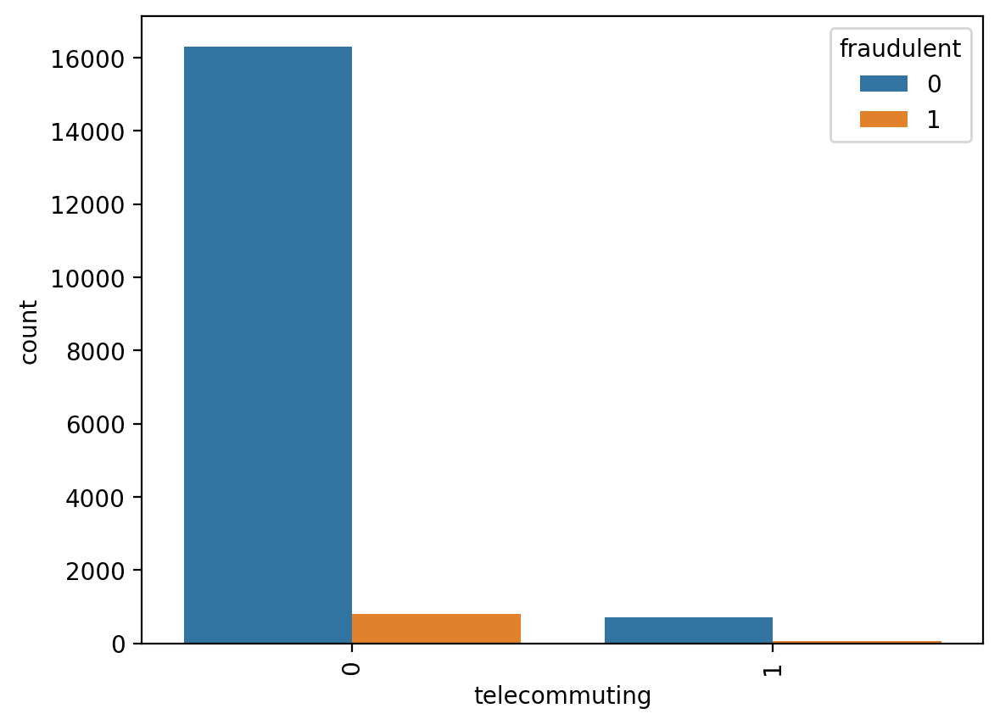

In [114]:
order_req = df['telecommuting'].value_counts().index
ax = sns.countplot(x = "telecommuting", data = df, order = order_req, hue = 'fraudulent')
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
plt.show()

### Combine text into one column

In [115]:
df['text']= df['title']+' '+df['location']+' '+df['company_profile']+' '+df['description']+' '+df['requirements']+' '+df['benefits']

columns_to_drop = [
    'title', 'location', 'department', 'company_profile',
    'description', 'requirements', 'benefits',
    'industry', 'function', 'country',
    'job_id', 'salary_range', 'has_company_logo', 'has_questions', 'employment_type'
]

df = df.drop(columns=columns_to_drop)


Final df, cleaned, ready for use in NLP methods.

In [116]:
df.head()

,telecommuting,required_experience,required_education,fraudulent,text
0,0,4,9,0,"Marketing Intern US, NY, New York We're Food52..."
1,0,6,9,0,"Customer Service - Cloud Video Production NZ, ..."
2,0,6,9,0,"Commissioning Machinery Assistant (CMA) US, IA..."
3,0,5,1,0,"Account Executive - Washington DC US, DC, Wash..."
4,0,5,1,0,"Bill Review Manager US, FL, Fort Worth SpotSou..."


WordCLoud analysis to check distributions of words in the text, depending on fraudulent class

In [117]:
from wordcloud import WordCloud

# Separating the fraudulent jobs from the real ones.
fraudjobs_text = df[df.fraudulent==1].text
actualjobs_text = df[df.fraudulent==0].text

Looking at the most common words in the fraudulent class.

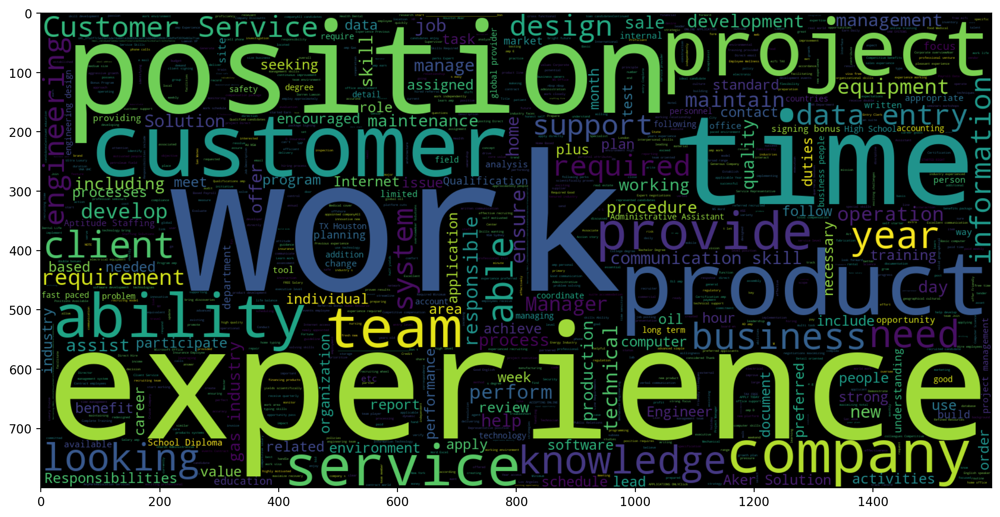

In [118]:
"""Fraudulent JOBS WORDS"""

STOPWORDS = spacy.lang.en.stop_words.STOP_WORDS
plt.figure(figsize = (14,10))
# applying the word cloud.
wc = WordCloud(min_font_size = 3,  max_words = 3000 , width = 1600 , height = 800 , stopwords = STOPWORDS).generate(str(" ".join(fraudjobs_text)))
plt.imshow(wc,interpolation = 'bilinear')

Looking at the real job postings and the most common words.

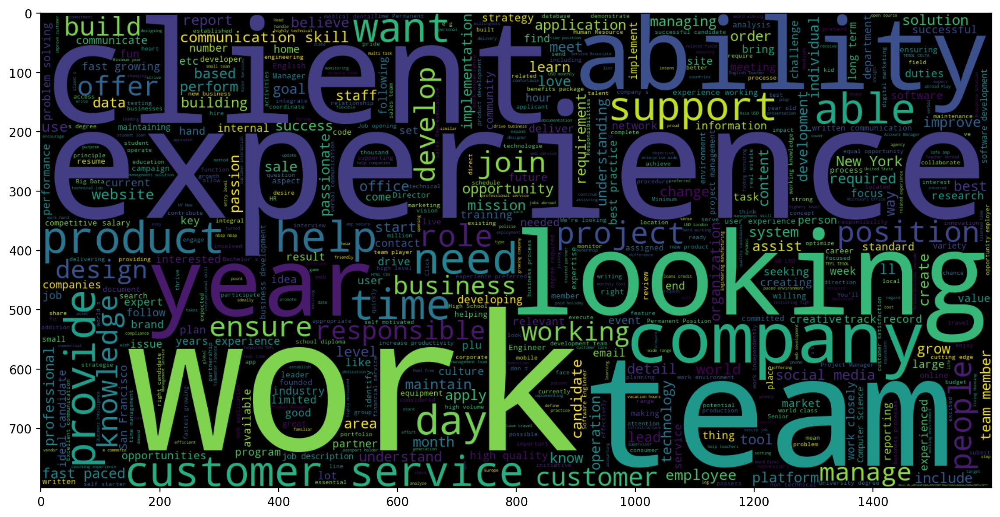

In [119]:
"""REAL JOBS WORDS"""

plt.figure(figsize = (14,10))
wc = WordCloud(min_font_size = 3,  max_words = 3000 , width = 1600 , height = 800 , stopwords = STOPWORDS).generate(str(" ".join(actualjobs_text)))
plt.imshow(wc,interpolation = 'bilinear')

Remove very generic words for prediction

In [120]:
"""Add to stopwords list very generic words"""
generic_words = {'experience', 'work', 'team', 'company', 'time'}

After removing the generic words, we can see the Word Cloud change.

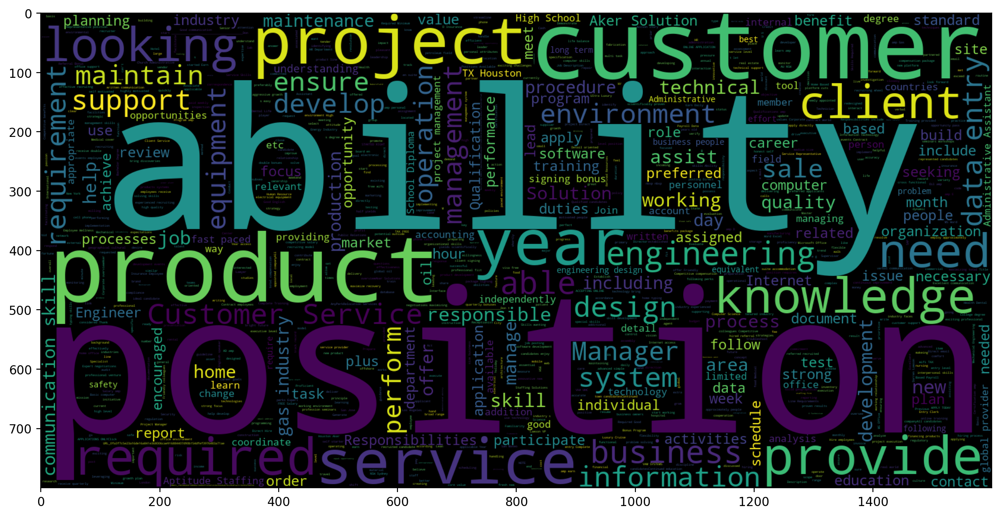

In [121]:
"""UPDATED FRAUDULENT JOBS WORDS"""

STOPWORDS = spacy.lang.en.stop_words.STOP_WORDS
STOPWORDS.update(generic_words)
plt.figure(figsize = (14,10))
wc = WordCloud(min_font_size = 3,  max_words = 3000 , width = 1600 , height = 800 , stopwords = STOPWORDS).generate(str(" ".join(fraudjobs_text)))
plt.imshow(wc,interpolation = 'bilinear')

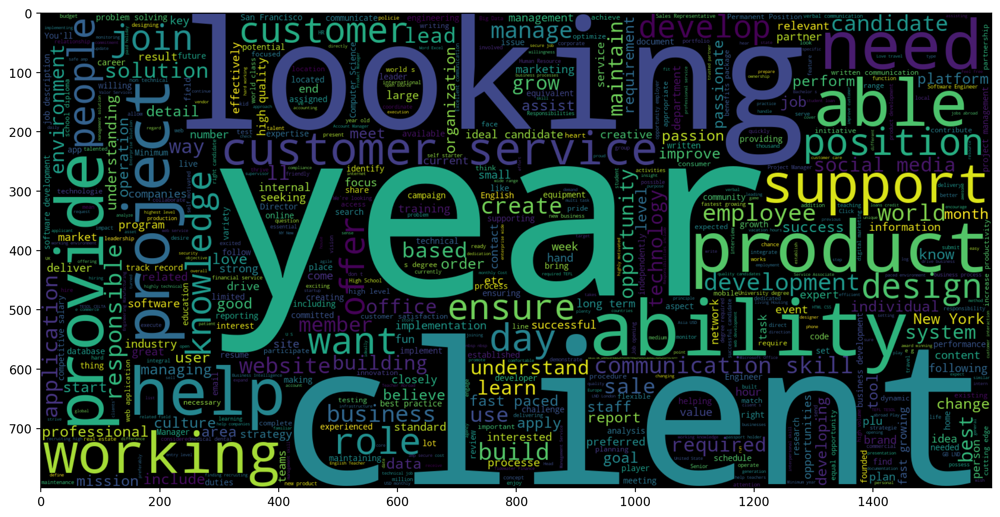

In [122]:
"""UPDATED REAL JOBS WORDS"""

plt.figure(figsize = (14,10))
wc = WordCloud(min_font_size = 3,  max_words = 3000 , width = 1600 , height = 800 , stopwords = STOPWORDS).generate(str(" ".join(actualjobs_text)))
plt.imshow(wc,interpolation = 'bilinear')

We see a slight difference in distribution of the most used words in both descriptions. Good visual analysis

# Tokenization

In [6]:
!python -m spacy download en_core_web_sm
nlp = spacy.load('en_core_web_sm')

     ---------------------------------------- 0.0/12.8 MB ? eta -:--:--
     - -------------------------------------- 0.4/12.8 MB 13.4 MB/s eta 0:00:01
     ---- ----------------------------------- 1.4/12.8 MB 17.1 MB/s eta 0:00:01
     ------- -------------------------------- 2.3/12.8 MB 18.0 MB/s eta 0:00:01
     ---------- ----------------------------- 3.3/12.8 MB 17.4 MB/s eta 0:00:01
     ------------- -------------------------- 4.3/12.8 MB 18.3 MB/s eta 0:00:01
     ---------------- ----------------------- 5.2/12.8 MB 18.3 MB/s eta 0:00:01
     ----------------- ---------------------- 5.5/12.8 MB 17.6 MB/s eta 0:00:01
     ------------------- -------------------- 6.3/12.8 MB 16.8 MB/s eta 0:00:01
     ---------------------- ----------------- 7.2/12.8 MB 16.9 MB/s eta 0:00:01
     ------------------------- -------------- 8.2/12.8 MB 16.9 MB/s eta 0:00:01
     ---------------------------- ----------- 9.2/12.8 MB 17.8 MB/s eta 0:00:01
     ------------------------------- ------- 10.

In [3]:
import re

# preprocessing the text for use in NLP.
def preprocess_text(text):
    text = re.sub(r'(?<=[a-z])(?=[A-Z])', ' ', text) # for words like "awesomeLove" separates into "awesome love"
    text = re.sub(r'(?<=[.,!?()\/:;\\])|(?=[.,!?()\/:;\\])', r' ', text) #for sentences like "classic!)Fashion" into "classic fashion"
    
    doc = nlp(text)
    # making it a list of words
    tokens = [token.lemma_.lower() for token in doc if not token.is_punct and not token.is_space and not token.is_stop and len(token.text) > 2 and len(token.text) < 20]
    return tokens

df['text'] = df['text'].apply(preprocess_text)

Example of how the new dataframe looks like.

In [3]:
df.head()

,telecommuting,required_experience,required_education,fraudulent,text
0,0,4,9,0,"['marketing', 'intern', 'new', 'york', 'food52..."
1,0,6,9,0,"['customer', 'service', 'cloud', 'video', 'pro..."
2,0,6,9,0,"['commissioning', 'machinery', 'assistant', 'c..."
3,0,5,1,0,"['account', 'executive', 'washington', 'washin..."
4,0,5,1,0,"['bill', 'review', 'manager', 'fort', 'worth',..."


Analysis on word frequency:

Seeing the words most frequent in each class. Their count is included.

In [7]:
fraudjobs_text = " ".join(df[df.fraudulent == 1]['text'].astype(str))
actualjobs_text = " ".join(df[df.fraudulent == 0]['text'].astype(str))

# Dividir el texto en fragmentos más pequeños
def chunk_text(text, chunk_size=800000):
    chunks = []
    text_length = len(text)
    num_chunks = int(np.ceil(text_length / chunk_size))
    for i in range(num_chunks):
        start = i * chunk_size
        end = min((i + 1) * chunk_size, text_length)
        chunks.append(text[start:end])
    return chunks

# Procesar cada fragmento de texto y obtener los tokens
def process_chunks(chunks, preprocess_func):
    all_tokens = []
    for chunk in chunks:
        tokens = preprocess_func(chunk)
        all_tokens.extend(tokens)
    return all_tokens

# Dividir y procesar los textos
fraud_chunks = chunk_text(fraudjobs_text)
actual_chunks = chunk_text(actualjobs_text)

fraud_tokens = process_chunks(fraud_chunks, preprocess_text)
actual_tokens = process_chunks(actual_chunks, preprocess_text)

# Utiliza FreqDist para obtener las frecuencias de palabras en ambos conjuntos
from nltk.probability import FreqDist

fraud_freq = FreqDist(fraud_tokens)
actual_freq = FreqDist(actual_tokens)

# Muestra las palabras más comunes en trabajos fraudulentos
print("Frequency in fake jobs:")
print(fraud_freq.most_common(20))

# Muestra las palabras más comunes en trabajos legítimos
print("\nFrequency in real jobs:")
print(actual_freq.most_common(20))

Frequency in fake jobs:
[('work', 2382), ('experience', 1778), ('service', 1367), ('skill', 1327), ('customer', 1103), ('company', 1023), ('team', 987), ('amp', 984), ('product', 945), ('position', 931), ('time', 922), ('project', 865), ('system', 803), ('ability', 798), ('provide', 791), ('business', 784), ('include', 753), ('require', 738), ('year', 735), ('management', 727)]

Frequency in real jobs:
[('work', 56250), ('experience', 47675), ('team', 39597), ('service', 30218), ('company', 29489), ('customer', 27400), ('business', 24526), ('skill', 23830), ('client', 21481), ('product', 20433), ('provide', 19017), ('year', 18580), ('new', 18452), ('include', 17587), ('ability', 17478), ('management', 17122), ('development', 16961), ('sale', 16928), ('time', 16359), ('design', 15741)]


At first glance not a drastic difference between fake and real jobs

### Bi-grams detection

In [3]:
from gensim.models.phrases import Phrases

def bi_grams(corpus):
    phrase_model = Phrases(corpus, min_count=50, threshold=30)
    corpus = [el for el in phrase_model[corpus]]
    return corpus 

df['text'] = bi_grams(df['text'])

In [130]:
print(colored('\n============= Tokenized Text =============', 'blue'))
print(df['text'][0], "\n")

print(colored('\n============= Raw Text =============', 'blue'))

print(df_raw['title'][0]+' '+df_raw['location'][0]+' '+df_raw['company_profile'][0]+' '+df_raw['description'][0]+' '+df_raw['requirements'][0])


============= Tokenized Text =============
['marketing', 'intern', 'new_york', 'food52', 'create', 'groundbreaking', 'award_win', 'cooking', 'site', 'support', 'connect', 'celebrate', 'home_cook', 'need', 'place', 'editorial', 'business', 'engineering', 'focused', 'technology', 'find', 'new', 'well', 'way', 'connect', 'people', 'specific', 'food', 'interest', 'offer', 'superb', 'highly', 'curate', 'information', 'food', 'cooking', 'attract', 'talented', 'home_cook', 'contributor', 'country', 'publish', 'know', 'professional', 'like', 'mario', 'batali', 'gwyneth', 'paltrow', 'danny', 'meyer', 'partnership', 'foods', 'market', 'random', 'house', 'food52', 'name', 'good', 'food', 'website', 'james_beard', 'foundation', 'iacp', 'feature', 'new_york', 'times', 'npr', 'pando', 'daily', 'tech_crunch', 'today', 'locate_chelsea', 'new_york', 'city', 'food52', 'fast', 'grow', 'james_beard', 'award_win', 'online', 'food', 'community', 'crowd', 'source', 'curate', 'recipe', 'hub', 'currently', 'i

Final tokenized and preprocessed text

### N-grams analysis

In [131]:
from collections import defaultdict
ngram_counts = defaultdict(int)

# Iterate through the corpus to count N-grams
for doc in df['text']:
    for token in doc:
        if '_' in token:  # Only consider N-grams
            ngram_counts[token] += 1

ngram_list = [(ngram, count) for ngram, count in ngram_counts.items()]
Ngrams_df = pd.DataFrame(ngram_list, columns=['N-gram', 'Count'])
Ngrams_df = Ngrams_df.sort_values(by='Count', ascending=False)

Ngrams_df.head() # very good results

,N-gram,Count
109,fast_pace,2723
8,social_medium,2587
0,new_york,2391
37,ideal_candidate,2111
91,long_term,2081


In [25]:
# saving the preprocessed_df
df.to_csv('preprocessed_df.csv', index=False) # later convert text list to tokenized words with ast library
df.to_pickle('tokenized.pkl') 

#### Gensim dictionary

In [13]:
from gensim import corpora
import ast

# Create a Gensim dictionary and save vocabulary
D = corpora.Dictionary(df['text'])
corpus = [D.doc2bow(doc) for doc in df['text']]
vocab = list(D.token2id.keys())

In [11]:
# Vocabulary coverage function to gain more insights on models

def get_vocabulary_coverage(model, gensim_dict):
    # Initialize variables for tracking coverage
    total_words = len(gensim_dict)
    covered_words = 0
    oov_words = 0

    # Calculate coverage for each word in the Gensim dictionary
    for word, _ in gensim_dict.items():
        if word in model:
            
            covered_words += 1
        else:
            # If the word is out-of-vocabulary, consider its frequency in the corpus
            oov_words += 1

    # Calculate coverage percentage
    coverage = (covered_words / total_words) * 100

    return coverage

To create embedding matrix for classification purposes using Word2Vec, GloVe...

In [12]:
def get_review_vector(model, review):
    # Initialize variables for vector sum and count of words in the model's vocabulary
    vec_sum = np.zeros(model.vector_size)
    count = 0

    for word in review:
        if word in model:
            # If the word is in the model's vocabulary, add its vector to the sum
            vec_sum += model[word]
            count += 1

    # Calculate the average vector for the review
    if count > 0:
        review_vector = vec_sum / count
    else:
        review_vector = None

    return review_vector

# Vectorization Methods

### BoW

In [14]:
from sklearn.feature_extraction.text import CountVectorizer

In [15]:
# Joining the tokens by spaces
df['text_joined'] = df['text'].apply(lambda tokens: ' '.join(tokens))
# Using the count vectorizer for the BOW representation
vectorizer = CountVectorizer(tokenizer=None)

# Sparse matrix
bow_matrix = vectorizer.fit_transform(df['text_joined'])
bow_matrix 

#Ready to use for prediction

<17880x46177 sparse matrix of type '<class 'numpy.int64'>'
	with 2829592 stored elements in Compressed Sparse Row format>

### Machine Learning Methods

Importing what we need for all machine learning models and performance metrics.

In [16]:
# models
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import OneClassSVM
from sklearn.ensemble import IsolationForest
from sklearn.decomposition import PCA
from sklearn.mixture import GaussianMixture
from sklearn.svm import SVC

# non-models.
from sklearn.metrics import accuracy_score, classification_report
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from scipy.sparse import csr_matrix, hstack

In [17]:
X = bow_matrix
y = df['fraudulent']  

The bag of words matrix is a sparse matrix:

In [18]:
bow_matrix

<17880x46177 sparse matrix of type '<class 'numpy.int64'>'
	with 2829592 stored elements in Compressed Sparse Row format>

### BoW -- Machine Learning Models

The models used in this section are the following:

**Supervised Learning:** 

- Logistic regression
- SVM (rbf kernel)
- Random Forest

**Unsupervised Learning:**
- One-class SVM
- PCA + Gaussian mixture model

Functions for applying the logistic regression and Random Forest models.
- Does the train test split of the data already.
- Prints out the classification report and returns (fitted model, predicted values for y, classification report).


Our main performance objective is to maximize the recall and the macro F1-Score of the predictions (with train test split). This way we can make sure that it is correctly classifying the fraudulent cases given that we have a large imbalance between the classes.

In [24]:
# --------------------------------------- Supervised learning --------------------------------------------

def apply_logregress(X,y, max_iter=1000, penalty = 'l2', C = 0.1):

    """
    Apply the logistic regression model for any type of input (X) and output class (y).

        Input:     

            - X (data for training and testing)
            - y (binary class variable)
        returns: 

            - model
            - predicted values for y
            - the report

        prints:
            - report

    """
    # Doing the splitting of the data set.
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

    # Applying LR to the data
    model = LogisticRegression(max_iter=max_iter, penalty = penalty, C = C)
    model.fit(X_train, y_train)

    # Predicting the testing set for classification report.
    y_pred = model.predict(X_test)
    report = classification_report(y_test, y_pred)
    print(f"\nLogistic Regression Classification Report: -------------\n{report}")
    return model, y_pred, report

def apply_RandomForestClass(X, y, n_estimators=200, max_depth = 10):

    """
    Apply the Random forest model for any type of input (X) and output class (y).
        
        input:
            - X (our data to train and test)
            - y (binary class variable)

        returns: 
            - model
            - predicted values for y
            - the report

        prints:
            - report
    """
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

    # Create a Random Forest classifier
    rf = RandomForestClassifier(n_estimators=n_estimators,max_depth=max_depth, random_state=42)
    # fitting the training set.
    rf.fit(X_train,y_train)


    # testing the test set
    y_pred = rf.predict(X_test)
    # Obtaining the classification report.
    report = classification_report(y_test, y_pred)
    print(f"\nRandom Forest Classifier Classification Report: -------------\n{report}")
    return rf, y_pred, report



def apply_SVM(X_input, y, kernel='rbf', C=10, gamma='scale'):

    """
        Inputs:
            - X_input (our data to be used for training and testing)
            - y (binary class variable).

        Outputs:
            - SVM model
            - Predicted y
            - Classification report (prints as well)

    """

    # Splitting the data set.
    X_train, X_test, y_train, y_test = train_test_split(X_input, y, test_size=0.25, random_state=42)

    # Fitting the SVC
    svm_rbf = SVC(kernel=kernel, C=C, gamma=gamma)  # 'scale' for gamma is a common starting point
    svm_rbf.fit(X_train, y_train)

    # Evaluate the model

    y_pred = svm_rbf.predict(X_test)

    # Getting the classification report.
    class_report = classification_report(y_test, y_pred)

    print(f"\nSupport Vector Machine Classification Report: -------------\n{class_report}")

    return svm_rbf, y_pred, class_report




# --------------------------------------- Unsupervised learning --------------------------------------------

def apply_OneSVM(X_nonfraud, X_fraud, nu = 0.1):

    """
    
        Inputs:
        
        - X_fraud = fraudulent input data (could include more than just the bag of words representation). --> TEST data
        - X_nonfraud = non fraudulent input data. --> TRAIN data

        - nu = SVM hyperparameter, proportion of expected outliers (default is set to 0.1 since we have a very low proportion of outliers).

        Outputs:

        - Model, predicted y, and the classification report (prints it out as well).
    """

    # Using the One class SVM
    ocsvm = OneClassSVM(kernel='rbf', nu=nu)  # Adjust 'nu' for different sensitivity

    # Training on the non fraudulent data
    ocsvm.fit(X_nonfraud)

    # Predict on the test set (fraudulent data)
    y_pred = ocsvm.predict(X_fraud)

    # Convert predictions to a binary classification (1 for fraudulent, 0 for non-fraudulent)
    y_pred = np.where(y_pred == -1, 1, 0)  # the predictions given by one class svm is -1 for outlier and 1 for outlier.
    # we need to change this to have just 1 and 0

    # Create ground truth for evaluation
    y_fraud = np.ones(X_fraud.shape[0])  # All test data is fraudulent so we just make a list of ones

    # Generate a classification report to assess the model's performance
    report = classification_report(y_fraud, y_pred, zero_division=1)
    print("Classification Report:")
    print(report)

    return ocsvm, y_pred, report


def apply_GMM(X_pca, y_true):

    """
        Applying Gaussian Mixture model on PCA results. Uses 2 components so that we can
        and classify

        Input:
        - X_pca = pca output.
        - y_true = true labels

        output:

        - gmm - model trained
        - clusters_fixed - clusters with assigned labels (for classification)
        - class_report - classification report.
    """

    # Creating a generic Gaussian Mixture Model
    gmm = GaussianMixture(n_components=2, covariance_type='full',random_state=42)
    gmm.fit(X_pca)

    # Predict the clusters
    clusters = gmm.predict(X_pca)

    # Fixing the clusters (for indirect classification)
    clusters_fixed = [1-each for each in clusters]

    # Getting the final classification report.
    class_report = classification_report(y_true, clusters_fixed)

    print(class_report)

    return gmm, clusters_fixed, class_report

Models on just the Bag of Words Vectorization 

In [10]:
X = bow_matrix
y = np.array(df['fraudulent'])

For hyperparameter selection we can use the param grid, pipeline, and a grid search cross validation method. 

- For the SVM, we only searched through the C and gamma parameters, meanwhile using an rbf kernel since it can capture complex relationships that are non linear. 

- For the Logistic regression we went through several values of C and also tried the different penalties L1 and L2. 

- For the Random forest grid search, only the n_estimators and max depth parameter was searched through.

In [25]:
# Pipeline of only SVC model
svm_pipeline = Pipeline([
    ('classifier', SVC())
])

# Param Grid of the parameter values to try.
svm_param_grid = {
    'classifier__C': [0.1, 1, 10],
    'classifier__gamma': ['scale', 'auto'],
    'classifier__kernel': ['rbf']
}

# SVC grid search application with only 3 folds.
svm_grid_search = GridSearchCV(svm_pipeline, param_grid=svm_param_grid, cv=3, n_jobs=-1)
svm_grid_search.fit(X, y)

GridSearchCV(cv=3, estimator=Pipeline(steps=[('classifier', SVC())]), n_jobs=-1,
             param_grid={'classifier__C': [0.1, 1, 10],
                         'classifier__gamma': ['scale', 'auto'],
                         'classifier__kernel': ['rbf']})

In [26]:
print("Best SVM Parameters:", svm_grid_search.best_params_)

Best SVM Parameters: {'classifier__C': 10, 'classifier__gamma': 'scale', 'classifier__kernel': 'rbf'}


Logistic Regression pipeline grid search CV:

In [27]:
# Pipeline of only LR model
lr_pipeline = Pipeline([
    ('classifier', LogisticRegression(solver='liblinear'))
])

# Param Grid of the parameter values to try.
lr_param_grid = {
    'classifier__C': [0.1, 1, 10],
    'classifier__penalty': ['l1', 'l2']
}
# lr grid search application with only 3 folds.
lr_grid_search = GridSearchCV(lr_pipeline, param_grid=lr_param_grid, cv=3, n_jobs=-1)
lr_grid_search.fit(X, y)
print("Best Logistic Regression Parameters:", lr_grid_search.best_params_)

Best Logistic Regression Parameters: {'classifier__C': 0.1, 'classifier__penalty': 'l2'}


Random Forest pipeline:

In [28]:
# Pipeline of only RF model
rf_pipeline = Pipeline([
    ('classifier', RandomForestClassifier())
])

# Param Grid of the parameter values to try.
rf_param_grid = {
    'classifier__n_estimators': [100, 200, 300],
    'classifier__max_depth': [None, 10, 20]
}

# rf grid search application with only 3 folds.
rf_grid_search = GridSearchCV(rf_pipeline, param_grid=rf_param_grid, cv=3, n_jobs=-1)
rf_grid_search.fit(X, y)

print("Best Random Forest Parameters:", rf_grid_search.best_params_)

Best Random Forest Parameters: {'classifier__max_depth': None, 'classifier__n_estimators': 200}


Using the best parameters we apply the functions created previously:

In [30]:
# Applying the Random Forest
my_rf = apply_RandomForestClass(X, y, n_estimators = 200, max_depth = None)

# Applying the logistic regression
my_logreg = apply_logregress(X,y, C = 0.1, penalty='l2')

# Applying the SVM
my_svm = apply_SVM(X,y, C = 10, gamma = 'scale')


Random Forest Classifier Classification Report: -------------
              precision    recall  f1-score   support

           0       0.98      1.00      0.99      5093
           1       1.00      0.59      0.74       271

    accuracy                           0.98      5364
   macro avg       0.99      0.79      0.86      5364
weighted avg       0.98      0.98      0.98      5364


Logistic Regression Classification Report: -------------
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      5093
           1       0.92      0.72      0.81       271

    accuracy                           0.98      5364
   macro avg       0.95      0.86      0.90      5364
weighted avg       0.98      0.98      0.98      5364


Support Vector Machine Classification Report: -------------
              precision    recall  f1-score   support

           0       0.98      1.00      0.99      4247
           1       0.96      0.71      0.81       223



In general the best model to use is the Logistic regression model or the SVM with an rbf kernel. In this case, logistic regression is favorable since it is a much simpler model and can lead to better interpretations of the predictors since we have values for the constants.

Using additional features (`telecommuting`, `required_experience`, `required_education`) with the same hyperparameters found with the grid search cross validation method.

In [31]:
# Extract additional features
additional_features = df[['telecommuting', 'required_experience', 'required_education']].values

# Concatenate BoW with additional features
from scipy.sparse import hstack
X_additional = hstack([bow_matrix, additional_features])

y = np.array(df['fraudulent'])

# Applying the same models with the newly added data.
rf_add = apply_RandomForestClass(X_additional, y, n_estimators = 200, max_depth = None)

lr_add = apply_logregress(X_additional, y, C = 0.1, penalty='l2')

svm_add = apply_SVM(X_additional,y, C = 10, gamma = 'scale')


Random Forest Classifier Classification Report: -------------
              precision    recall  f1-score   support

           0       0.98      1.00      0.99      5093
           1       1.00      0.59      0.74       271

    accuracy                           0.98      5364
   macro avg       0.99      0.79      0.86      5364
weighted avg       0.98      0.98      0.98      5364


Logistic Regression Classification Report: -------------
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      5093
           1       0.92      0.72      0.81       271

    accuracy                           0.98      5364
   macro avg       0.95      0.86      0.90      5364
weighted avg       0.98      0.98      0.98      5364


Support Vector Machine Classification Report: -------------
              precision    recall  f1-score   support

           0       0.98      1.00      0.99      4247
           1       0.96      0.70      0.81       223



***Logistic regression improved in the recall for the 1 class by 0.01, but Random Forest worsened the recall for 1 (fraudulent) by 0.01. Not significant enough to warrant a more complex model.***

### Unsupervised Learning

In unsupervised learning we want to basically try and separate the classes using the following methods:

- One Class SVM 
    - Train it with just the non fraudulent data and then try and separate (detect the outliers) the fraudulent data.

- PCA 
    - Find a lower dimensional representation of our data that may separate the classes better.
    - Then use a clustering technique or classifier to obtain the classes.



##### 1. Using One-Class SVM for novelty detection

Hyperparameter tuning:

- For one-class SVM one should ideally only train the model with the nonfraudulent data to then see if the fraudulent data can be classified as outliers. Instead of using a grid search cross validation method to find out the best value for the hyperparameter in the One class SVM, we can just use a small value for the C hyperparameter which is a measure of how strict the classes are between each other. A low value was used in order to make sure that since the data is very closely represented (the fraudulent cases are very similar to the non fraud) then it can account for this.


In [11]:
df['text_joined'] = df['text'].apply(lambda tokens: ' '.join(tokens))

We need to separate between the fraudulent data and non fraudulent data so that we can use on for training.

In [12]:
# Separating between non fraudulent data and fraudulent data
non_fraudulent_data = df[df['fraudulent'] == 0]
fraudulent_data = df[df['fraudulent'] == 1]

In [13]:
vectorizer = CountVectorizer()

# Fit on non-fraudulent data and transform
X_train_bow = vectorizer.fit_transform(non_fraudulent_data['text_joined'])

# Transform the fraudulent test data
X_test_bow = vectorizer.transform(fraudulent_data['text_joined'])


# To train with more features ------------
# 
train_additional_features = non_fraudulent_data[['telecommuting', 'required_experience', 'required_education']]
test_additional_features = fraudulent_data[['telecommuting', 'required_experience', 'required_education']]

# Stack BoW with additional features
X_train_add = hstack([X_train_bow, train_additional_features])
X_test_add = hstack([X_test_bow, test_additional_features])

In [145]:
# Results with the text BOW data only
svm_results = apply_OneSVM(X_train_bow, X_test_bow)

print("Results with additional features:")

# Results with the additional features as well
svm_results_add = apply_OneSVM(X_train_add, X_test_add)

Classification Report:
              precision    recall  f1-score   support

         0.0       0.00      1.00      0.00         0
         1.0       1.00      0.10      0.17       866

    accuracy                           0.10       866
   macro avg       0.50      0.55      0.09       866
weighted avg       1.00      0.10      0.17       866

Results with additional features:
Classification Report:
              precision    recall  f1-score   support

         0.0       0.00      1.00      0.00         0
         1.0       1.00      0.09      0.17       866

    accuracy                           0.09       866
   macro avg       0.50      0.55      0.08       866
weighted avg       1.00      0.09      0.17       866



Terrible results due to no clear separation between the two classes. Also, it is very hard to split the data between two classes since there is a large imbalance. This is seen in the Exploratory Analysis. Also with the additional features recall worsened, the new features add more noise to the data set.

### PCA


PCA is best done with standardized data but looking at the results of the standardized data, PCA did not provide good insights on the data. Therefore it was best for the use of unsupervised learning methods to simply just not standardize. This is also important since standardization changes the word embeddings into something different not characteristic of the real text.


In [14]:
X_combined = np.vstack([X_train_bow.toarray(), X_test_bow.toarray()])

# Getting the y labels as concatenations as well
y_true = np.concatenate([np.zeros(X_train_bow.shape[0]), np.ones(X_test_bow.shape[0])])

X_train_add
X_combined_add = np.vstack([X_train_add.toarray(), X_test_add.toarray()])

# Getting the y labels as concatenations as well
y_true_add = np.concatenate([np.zeros(X_train_add.shape[0]), np.ones(X_test_add.shape[0])])

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_combined)

X_scaled_add = scaler.fit_transform(X_combined_add)

In [15]:
num_components = 3 # Number of components to retain; adjust as needed
pca = PCA(n_components=num_components)
X_pca = pca.fit_transform(X_scaled)
X_pca_add = pca.fit_transform(X_scaled_add)

Plotting areas of interest of PCA with scaled data. Plotting the graph that showed the best results (Principal component 1 vs. Principal Component 3).

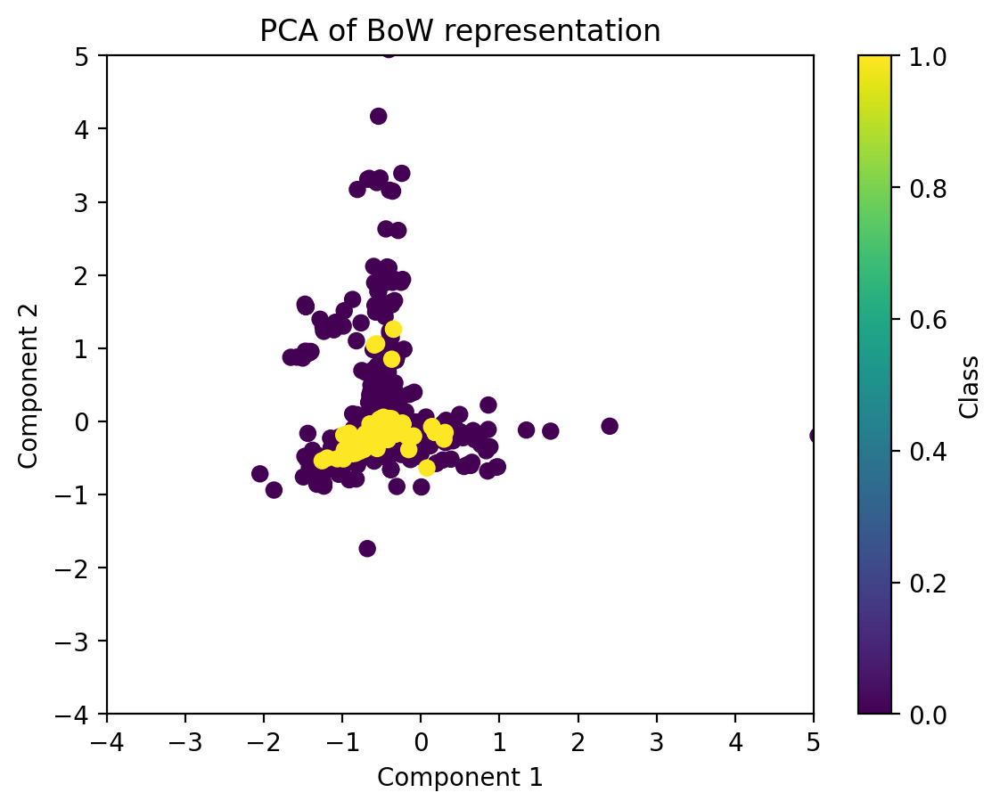

In [16]:
plt.scatter(X_pca[:,0], X_pca[:, 2], c = y_true)
plt.colorbar(label='Class')
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.xlim(-4,5)
plt.ylim(-4,5)
plt.title('PCA of BoW representation')
plt.show()

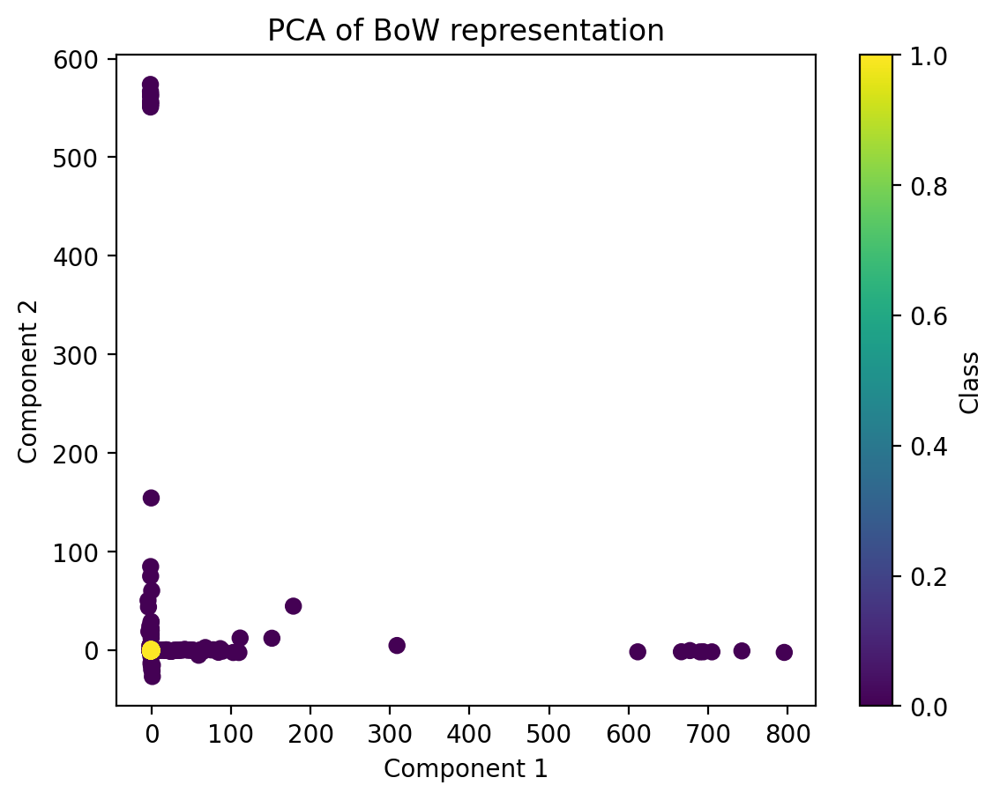

In [17]:
plt.scatter(X_pca_add[:,0], X_pca_add[:, 1], c = y_true_add)
plt.colorbar(label='Class')
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.title('PCA of BoW representation')
plt.show()

Scaling gives weird results, using PCA on non scaled data.

In [18]:
num_components = 3 # Number of components to retain; adjust as needed
pca = PCA(n_components=num_components)
X_pca = pca.fit_transform(X_combined)
X_pca_add = pca.fit_transform(X_combined_add)

Plotting the Second Principal component and the Third one for better visualization.

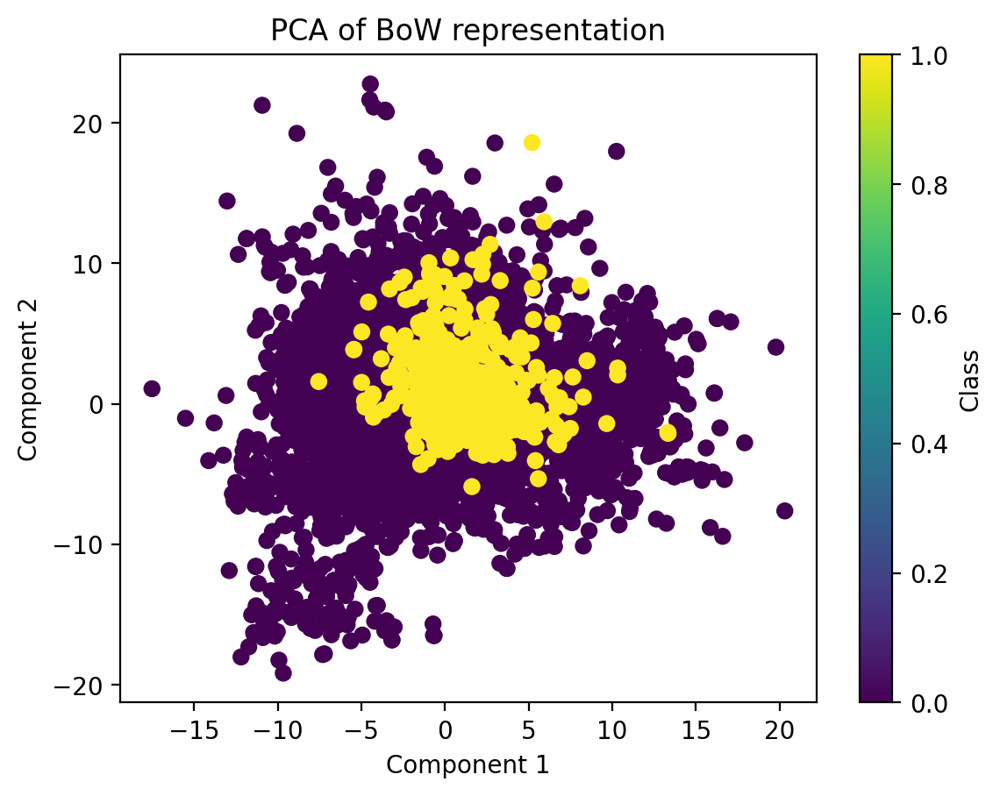

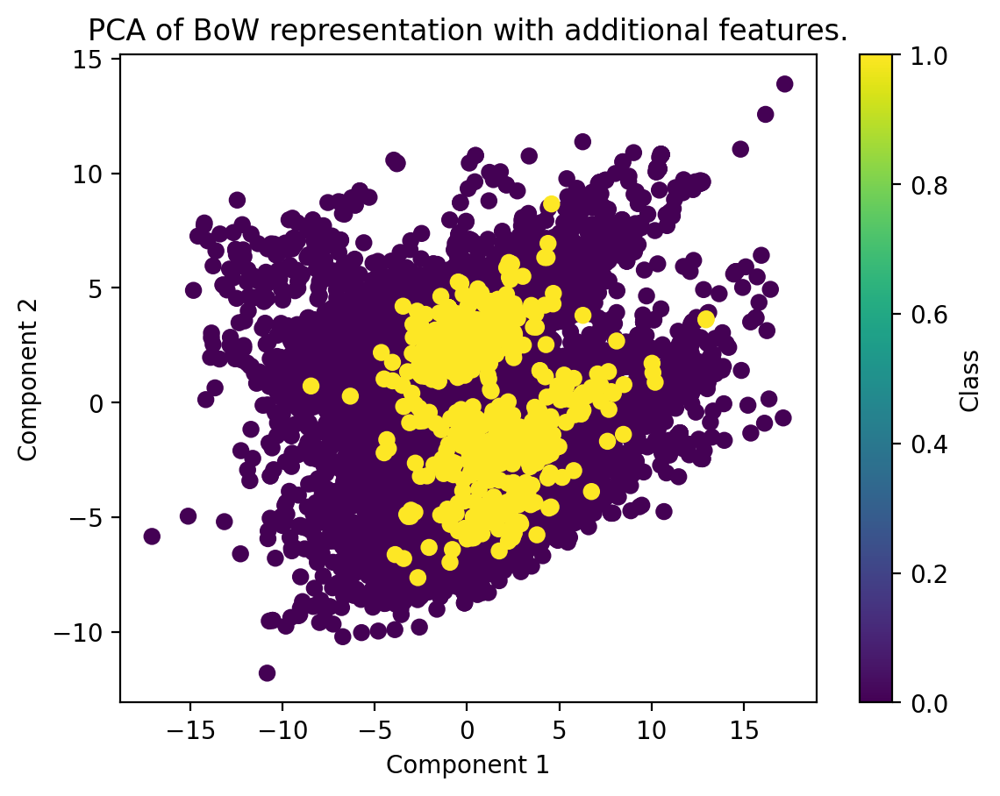

In [19]:
plt.scatter(X_pca[:,1], X_pca[:, 2], c = y_true)
plt.colorbar(label='Class')
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.title('PCA of BoW representation')
plt.show()

# PCA with additional features
plt.scatter(X_pca_add[:,1], X_pca_add[:, 2], c = y_true_add)
plt.colorbar(label='Class')
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.title('PCA of BoW representation with additional features.')
plt.show()

Gaussian Mixture Models:

A Gaussian Mixture model was used in order to try and cluster between points.

Hyperparameter tuning:

- The hyperparameters used were not found using cross validation. It is clear that since this is a classification task that the number of clusters has to be 2, meanwhile the covariance type should be full since the fraudulent class is mixed in well with the non fraudulent class.

In [22]:
gmm_norm = apply_GMM(X_pca, y_true)
clusters = gmm_norm[1]

              precision    recall  f1-score   support

         0.0       0.97      0.40      0.57     17014
         1.0       0.06      0.75      0.11       866

    accuracy                           0.42     17880
   macro avg       0.51      0.58      0.34     17880
weighted avg       0.93      0.42      0.55     17880



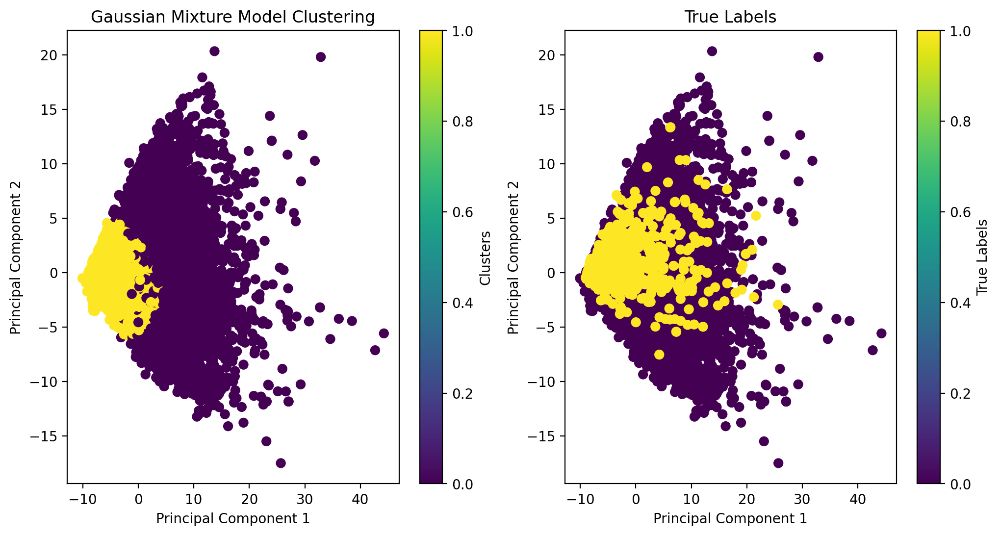

In [23]:
# Create a figure with two subplots, set size for clear visualization
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

# Plot Gaussian Mixture Model Clustering on the first subplot
scatter1 = ax1.scatter(X_pca[:, 0], X_pca[:, 1], c=clusters, s=40, cmap='viridis')
ax1.set_title("Gaussian Mixture Model Clustering")
ax1.set_xlabel('Principal Component 1')
ax1.set_ylabel('Principal Component 2')

# Add a colorbar to the first subplot
fig.colorbar(scatter1, ax=ax1, label='Clusters')

# Plot True Labels on the second subplot
scatter2 = ax2.scatter(X_pca[:, 0], X_pca[:, 1], c=y_true, s=40, cmap='viridis')
ax2.set_title("True Labels")
ax2.set_xlabel('Principal Component 1')
ax2.set_ylabel('Principal Component 2')

# Add a colorbar to the second subplot
fig.colorbar(scatter2, ax=ax2, label='True Labels')

# Display the plots
plt.show()

Doing the same but for the pca done with additional columns:

In [24]:
add_gmm = apply_GMM(X_pca_add, y_true_add)
clusters_add = add_gmm[1]

              precision    recall  f1-score   support

         0.0       0.94      0.59      0.73     17014
         1.0       0.03      0.24      0.05       866

    accuracy                           0.57     17880
   macro avg       0.48      0.42      0.39     17880
weighted avg       0.89      0.57      0.69     17880



Macro f1-score improved but recall worsened. Results in general are not valid for classification.

Visualizing the PCA output with the Gaussian Mixture Model results.

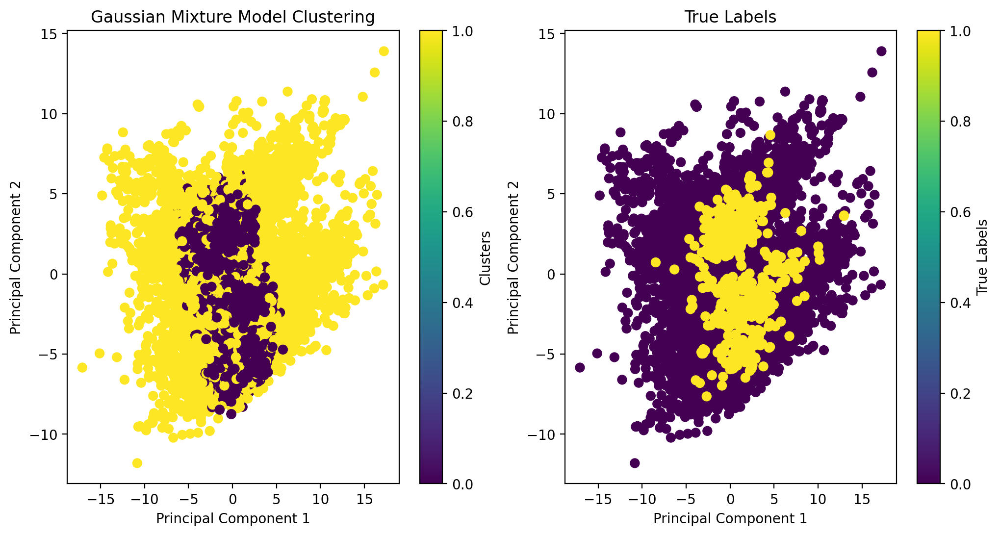

In [25]:
# Create a figure with two subplots, set size for clear visualization
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

# Plot Gaussian Mixture Model Clustering on the first subplot
scatter1 = ax1.scatter(X_pca_add[:, 1], X_pca_add[:, 2], c=clusters_add, s=40, cmap='viridis')
ax1.set_title("Gaussian Mixture Model Clustering")
ax1.set_xlabel('Principal Component 1')
ax1.set_ylabel('Principal Component 2')

# Add a colorbar to the first subplot
fig.colorbar(scatter1, ax=ax1, label='Clusters')

# Plot True Labels on the second subplot
scatter2 = ax2.scatter(X_pca_add[:, 1], X_pca_add[:, 2], c=y_true_add, s=40, cmap='viridis')
ax2.set_title("True Labels")
ax2.set_xlabel('Principal Component 1')
ax2.set_ylabel('Principal Component 2')

# Add a colorbar to the second subplot
fig.colorbar(scatter2, ax=ax2, label='True Labels')

# Display the plots
plt.show()

It seems somewhat better using the additional features, but still, the final results are not good

We can calculate the recall and F1 score for the true class label to compare to the other models:

The above shows the results of the Gaussian Mixture model that is an unsupervised technique usually done for clustering. In this case it was applied to the Bag of words data after using PCA to reduce the dimensions to just three principal components that captures most of the variance. In this case, it was used as a classification model so to have two clusters only (one for fraudulent and the other for non fraudulent). What occurred was that the recall of the positive class (fraudulent) increased in comparison to the logistic regressor (our best model so far) but then the F1 scores worsened substantially. This tells us that the model is of no use in terms of precision since it is giving too many false positives.

In general, the model does not perform well and also when doing PCA we lose interpretability with our data. Therefore, it is not a good idea to use this.


Because we have the problem of class imbalance it may be a good idea to try and fix this by resampling data using the SMOTE technique. This will then be compared with the original data set and the performance results we obtained there.



### SMOTE on Bag of Words

With SMOTE we plan on improving the class disbalance by resampling on the minority class.

In [26]:
from sklearn.feature_extraction.text import CountVectorizer
from imblearn.over_sampling import SMOTE

In [27]:
# Rereading the data to apply BoW and then apply SMOTE.
smote_dataset = pd.read_csv('preprocessed_df.csv')
smote_dataset

,telecommuting,required_experience,required_education,fraudulent,text
0,0,4,9,0,"['marketing', 'intern', 'new', 'york', 'food52..."
1,0,6,9,0,"['customer', 'service', 'cloud', 'video', 'pro..."
2,0,6,9,0,"['commissioning', 'machinery', 'assistant', 'c..."
3,0,5,1,0,"['account', 'executive', 'washington', 'washin..."
4,0,5,1,0,"['bill', 'review', 'manager', 'fort', 'worth',..."
...,...,...,...,...,...
17875,0,5,9,0,"['account', 'director', 'distribution', 'toron..."
17876,0,5,1,0,"['payroll', 'accountant', 'philadelphia', 'web..."
17877,0,6,9,0,"['project', 'cost', 'control', 'staff', 'engin..."
17878,0,6,6,0,"['graphic', 'designer', 'lagos', 'nemsia', 'st..."


In [28]:
# making the text a list of tokens if it hasnt been done already.
if type(smote_dataset['text'][0]) != list:
    smote_dataset['text'] = smote_dataset['text'].apply(ast.literal_eval)
else:
    print(type(df['text'][0]))


# Getting the BOW representation again
smote_dataset['text_joined'] = smote_dataset['text'].apply(lambda tokens: ' '.join(tokens))
vectorizer = CountVectorizer(tokenizer=None, max_features=5000)

bow_matrix = vectorizer.fit_transform(smote_dataset['text_joined'])
bow_matrix 

<17880x5000 sparse matrix of type '<class 'numpy.int64'>'
	with 2628069 stored elements in Compressed Sparse Row format>

In [29]:
text_df = pd.DataFrame(bow_matrix.toarray(), columns=vectorizer.get_feature_names_out())
data_combined = pd.concat([text_df, smote_dataset.drop('text', axis=1)], axis=1)


X = data_combined.drop('fraudulent', axis=1)
X= X.drop('text_joined',axis=1)
y = smote_dataset['fraudulent']

We want to avoid overfitting since this may be one of the problems with creating synthetic data. Therefore what one can do is first split the BoW data into training and testing and then use only the training dataset to create the resampled data set. After that, we use the resampled data to train our machine learning model and the testing set (unseen by the SMOTE) in order to test with this machine learning model

In [30]:
# We resample the training set (and use this for training) and test the models with the testing set.
X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size=0.35,
    random_state=42
)

In [31]:
# Smote algorithm for sampling
smote = SMOTE(sampling_strategy='minority')  # Resample prioritizing the minority class
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

Looking at the countplot for telecommuting now, we see a greater proportion of the fraudulent cases for our data set.

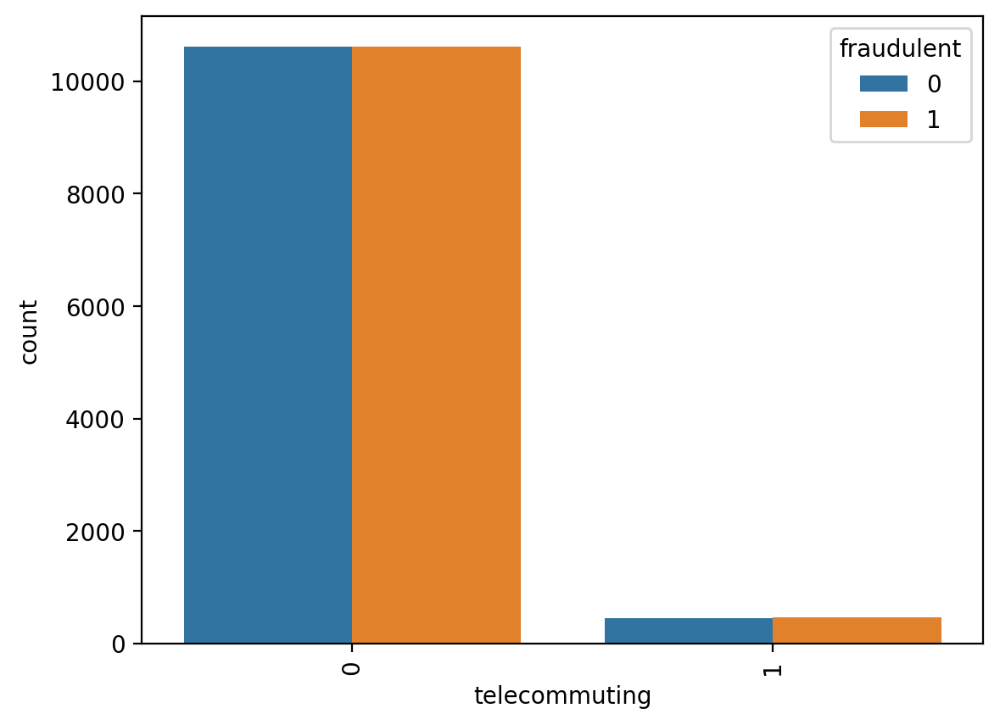

In [32]:
ax = sns.countplot(x = "telecommuting", data = X_train_resampled,  hue=y_train_resampled)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
plt.show()

Note that the classification results being shown for the training will show near to perfect results, it is important to know that these are not the real results of the models but rather just the training results. We must use real data from our dataset that has not been used for the resampling in order to provide clear performance of the models.

In [33]:
lr_model_smote = apply_logregress(X_train_resampled, y_train_resampled)

my_lr_smoteModel = lr_model_smote[0]


Logistic Regression Classification Report: -------------
              precision    recall  f1-score   support

           0       1.00      0.98      0.99      3336
           1       0.98      1.00      0.99      3306

    accuracy                           0.99      6642
   macro avg       0.99      0.99      0.99      6642
weighted avg       0.99      0.99      0.99      6642



Using data unseen by the SMOTE Model and the logistic regressor trained by the SMOTE data. We can see how our real data is being classified by the model.

In [34]:
y_pred = my_lr_smoteModel.predict(X_test)
report = classification_report(y_test, y_pred)
print(report)

              precision    recall  f1-score   support

           0       0.99      0.97      0.98      5945
           1       0.62      0.80      0.70       313

    accuracy                           0.97      6258
   macro avg       0.81      0.89      0.84      6258
weighted avg       0.97      0.97      0.97      6258



Training set classification report.

In [35]:
# Random Forest model
rf_model_smote = apply_RandomForestClass(X_train_resampled, y_train_resampled)

my_rf_smoteModel = rf_model_smote[0]


Random Forest Classifier Classification Report: -------------
              precision    recall  f1-score   support

           0       0.99      0.93      0.96      3336
           1       0.93      0.99      0.96      3306

    accuracy                           0.96      6642
   macro avg       0.96      0.96      0.96      6642
weighted avg       0.96      0.96      0.96      6642



True classification report on our testing set.

In [36]:
y_pred = my_rf_smoteModel.predict(X_test)
report = classification_report(y_test, y_pred)
print(report)

              precision    recall  f1-score   support

           0       0.99      0.93      0.96      5945
           1       0.37      0.82      0.51       313

    accuracy                           0.92      6258
   macro avg       0.68      0.87      0.73      6258
weighted avg       0.96      0.92      0.93      6258



In [37]:
# SVM

# Smote training set classification report
svm_model_smote = apply_SVM(X_train_resampled, y_train_resampled)
my_svm_smoteModel = svm_model_smote[0]

# Real data classification report.
y_pred = my_svm_smoteModel.predict(X_test)
report = classification_report(y_test, y_pred)
print(report)


Support Vector Machine Classification Report: -------------
              precision    recall  f1-score   support

           0       1.00      0.99      0.99      2793
           1       0.99      1.00      0.99      2742

    accuracy                           0.99      5535
   macro avg       0.99      0.99      0.99      5535
weighted avg       0.99      0.99      0.99      5535

              precision    recall  f1-score   support

           0       0.99      0.99      0.99      5945
           1       0.75      0.73      0.74       313

    accuracy                           0.97      6258
   macro avg       0.87      0.86      0.86      6258
weighted avg       0.97      0.97      0.97      6258



Applying PCA to the SMOTE data:

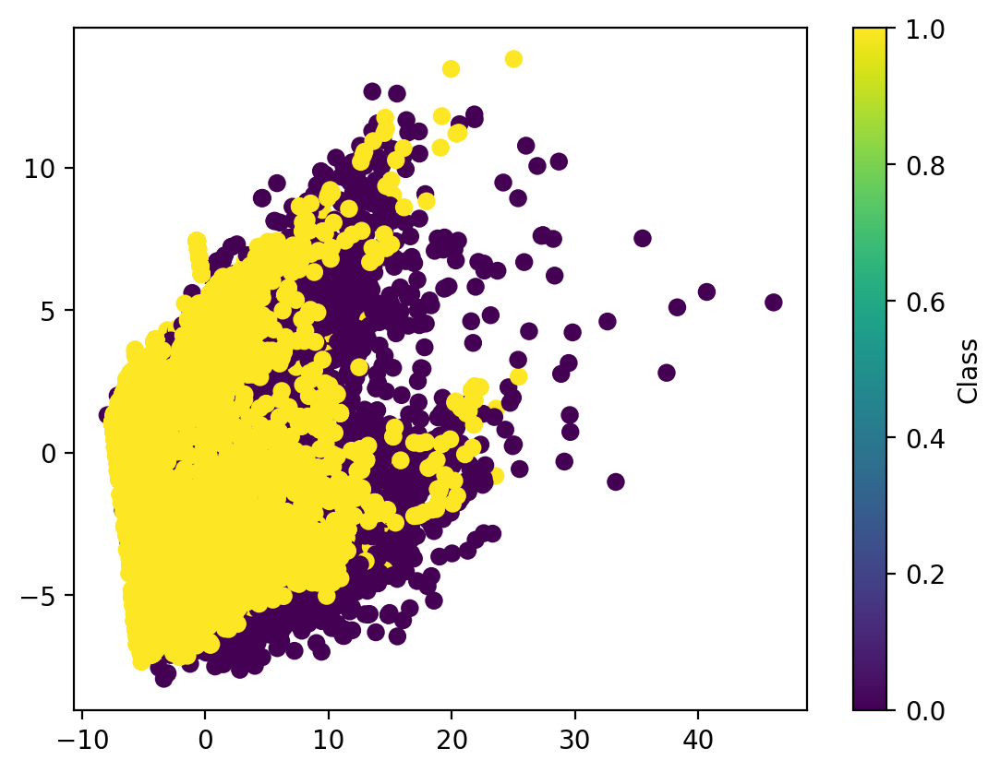

In [38]:
my_pca_smote = PCA(n_components=3)

X_pca_smote  = my_pca_smote.fit_transform(X_train_resampled)

plt.scatter(X_pca_smote[:,0], X_pca_smote[:, 1], c = y_train_resampled)
plt.colorbar(label='Class')
plt.show()

Clearly, the PCA representation does not show a clear distinction between the classes, therefore clustering (indirect classification) may not work here.

Removing the extra features:

In [39]:
columns_to_remove = ['telecommuting', 'required_experience', 'required_education']  

# Removing the extra features
X_train_resampled.drop(columns=columns_to_remove, inplace=True)
X_test.drop(columns=columns_to_remove, inplace=True)

Logistic regression:

In [40]:
lr_model_smote = apply_logregress(X_train_resampled, y_train_resampled)

my_lr_smoteModel = lr_model_smote[0]

# Report on unseen real data
y_pred = my_lr_smoteModel.predict(X_test)
report = classification_report(y_test, y_pred)
print(report)


Logistic Regression Classification Report: -------------
              precision    recall  f1-score   support

           0       1.00      0.98      0.99      3336
           1       0.98      1.00      0.99      3306

    accuracy                           0.99      6642
   macro avg       0.99      0.99      0.99      6642
weighted avg       0.99      0.99      0.99      6642

              precision    recall  f1-score   support

           0       0.99      0.98      0.98      5945
           1       0.63      0.79      0.70       313

    accuracy                           0.97      6258
   macro avg       0.81      0.88      0.84      6258
weighted avg       0.97      0.97      0.97      6258



Random Forest:

In [41]:
# Random Forest model
rf_model_smote = apply_RandomForestClass(X_train_resampled, y_train_resampled)

my_rf_smoteModel = rf_model_smote[0]

# Report on unseen data
y_pred = my_rf_smoteModel.predict(X_test)
report = classification_report(y_test, y_pred)
print(report)


Random Forest Classifier Classification Report: -------------
              precision    recall  f1-score   support

           0       0.99      0.93      0.96      3336
           1       0.93      0.99      0.96      3306

    accuracy                           0.96      6642
   macro avg       0.96      0.96      0.96      6642
weighted avg       0.96      0.96      0.96      6642

              precision    recall  f1-score   support

           0       0.99      0.93      0.96      5945
           1       0.38      0.81      0.51       313

    accuracy                           0.92      6258
   macro avg       0.68      0.87      0.74      6258
weighted avg       0.96      0.92      0.94      6258



SVM:

In [42]:
svm_model_smote = apply_SVM(X_train_resampled, y_train_resampled)
my_svm_smoteModel = svm_model_smote[0]

# Report on unseen data.
y_pred = my_svm_smoteModel.predict(X_test)
report = classification_report(y_test, y_pred)
print(report)


Support Vector Machine Classification Report: -------------
              precision    recall  f1-score   support

           0       1.00      0.99      0.99      2793
           1       0.99      1.00      0.99      2742

    accuracy                           0.99      5535
   macro avg       0.99      0.99      0.99      5535
weighted avg       0.99      0.99      0.99      5535

              precision    recall  f1-score   support

           0       0.99      0.99      0.99      5945
           1       0.75      0.73      0.74       313

    accuracy                           0.97      6258
   macro avg       0.87      0.86      0.86      6258
weighted avg       0.97      0.97      0.97      6258



PCA + GMM:

- Shows no clear distinction between both classes. SMOTE just overlaps the two classes, worsening interpretation.

In [43]:
# Concatenating rows:
merged_x = pd.concat([X_train_resampled, X_test], axis = 0)

merged_y = pd.concat([y_train_resampled, y_test], axis = 0)

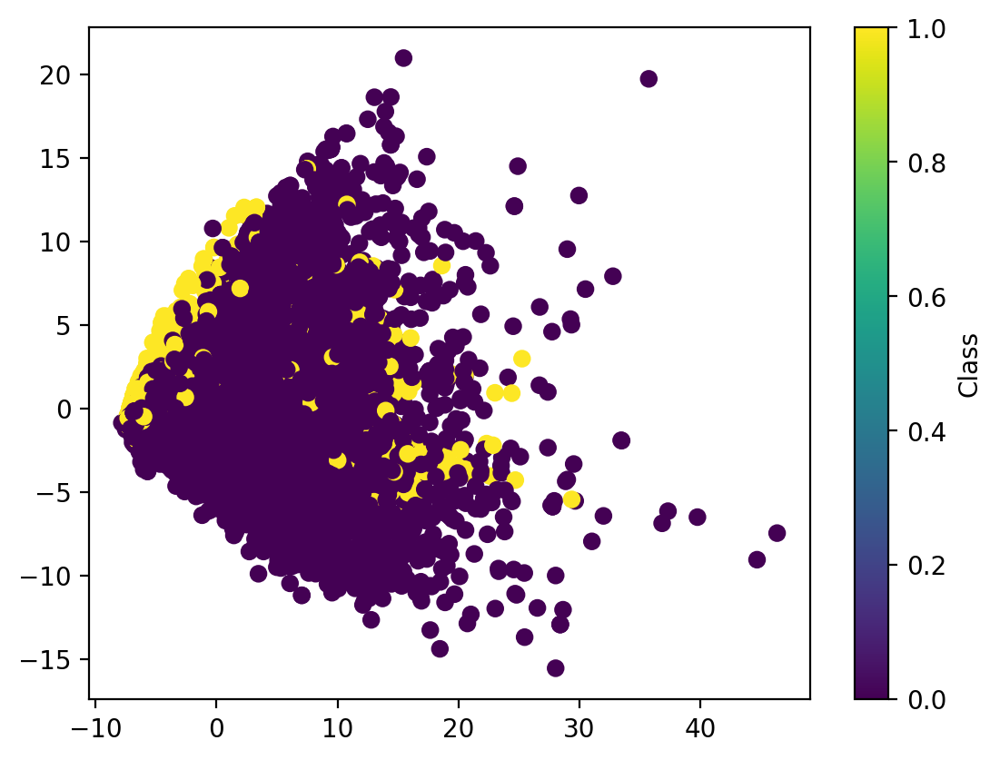

In [44]:
my_pca_smote = PCA(n_components=3)

X_pca_smote  = my_pca_smote.fit_transform(merged_x)

plt.scatter(X_pca_smote[:,0], X_pca_smote[:, 1], c = merged_y)
plt.colorbar(label='Class')
plt.show()

# TF-IDF 

In [19]:
from sklearn.feature_extraction.text import TfidfVectorizer


# Using sklearns tfidf vectorizer.
tfidf_vectorizer = TfidfVectorizer()
X_tfidf = tfidf_vectorizer.fit_transform(df['text_joined'])
X_tfidf

<17880x46177 sparse matrix of type '<class 'numpy.float64'>'
	with 2829592 stored elements in Compressed Sparse Row format>

Classify using TF-IDF we use the same approach as with BoW, If we need more variables, use hstack.

Applying the same procedure as with the Bag Of Words data. This time providing different hyperparameters.

In [20]:
svm_pipeline = Pipeline([
    ('classifier', SVC())
])

svm_param_grid = {
    'classifier__C': [0.1, 1, 10],
    'classifier__gamma': ['scale', 'auto'],
    'classifier__kernel': ['rbf']
}

svm_grid_search = GridSearchCV(svm_pipeline, param_grid=svm_param_grid, cv=3, n_jobs=-1)
svm_grid_search.fit(X_tfidf, y)
print("Best SVM Parameters:", svm_grid_search.best_params_)

Best SVM Parameters: {'classifier__C': 10, 'classifier__gamma': 'scale', 'classifier__kernel': 'rbf'}


In [21]:
lr_pipeline = Pipeline([
    ('classifier', LogisticRegression(solver='liblinear'))
])

lr_param_grid = {
    'classifier__C': [0.1, 1, 10],
    'classifier__penalty': ['l1', 'l2']
}

lr_grid_search = GridSearchCV(lr_pipeline, param_grid=lr_param_grid, cv=3, n_jobs=-1)
lr_grid_search.fit(X_tfidf, y)
print("Best Logistic Regression Parameters:", lr_grid_search.best_params_)

Best Logistic Regression Parameters: {'classifier__C': 10, 'classifier__penalty': 'l1'}


In [22]:
rf_pipeline = Pipeline([
    ('classifier', RandomForestClassifier())
])

rf_param_grid = {
    'classifier__n_estimators': [100, 200, 300],
    'classifier__max_depth': [None, 10, 20]
}

rf_grid_search = GridSearchCV(rf_pipeline, param_grid=rf_param_grid, cv=3, n_jobs=-1)
rf_grid_search.fit(X_tfidf, y)

print("Best Random Forest Parameters:", rf_grid_search.best_params_)

Best Random Forest Parameters: {'classifier__max_depth': None, 'classifier__n_estimators': 300}


In [25]:
y = df['fraudulent']  

# logistic regression
tfidf_logreg= apply_logregress(X_tfidf, y, penalty ='l1', C = 10)

# random forest
tfidf_rf = apply_RandomForestClass(X_tfidf, y, n_estimators = 300, max_depth = None)

# svm
tfidf_svm = apply_SVM(X_tfidf, y, C = 10, gamma = 'scale')


Logistic Regression Classification Report: -------------
              precision    recall  f1-score   support

           0       0.97      1.00      0.98      5093
           1       1.00      0.40      0.57       271

    accuracy                           0.97      5364
   macro avg       0.98      0.70      0.78      5364
weighted avg       0.97      0.97      0.96      5364


Random Forest Classifier Classification Report: -------------
              precision    recall  f1-score   support

           0       0.98      1.00      0.99      5093
           1       1.00      0.58      0.74       271

    accuracy                           0.98      5364
   macro avg       0.99      0.79      0.86      5364
weighted avg       0.98      0.98      0.98      5364


Support Vector Machine Classification Report: -------------
              precision    recall  f1-score   support

           0       0.98      1.00      0.99      4247
           1       1.00      0.68      0.81       223



Using additional features, using the same hyperparameters found in the non additional data set.

In [26]:
additional_feat = df[['telecommuting', 'required_experience', 'required_education']].values

# Concatenate BoW with additional features
from scipy.sparse import hstack
X_tfidf_add = hstack([X_tfidf, additional_feat])

tfidf_lr_add = apply_logregress(X_tfidf_add, y, penalty ='l1', C = 10)

tfidf_rf_add = apply_RandomForestClass(X_tfidf_add, y, n_estimators = 300, max_depth = None)

tfidf_svm_add = apply_SVM(X_tfidf_add,y, C = 10, gamma = 'scale')


Logistic Regression Classification Report: -------------
              precision    recall  f1-score   support

           0       0.97      1.00      0.98      5093
           1       1.00      0.40      0.57       271

    accuracy                           0.97      5364
   macro avg       0.98      0.70      0.78      5364
weighted avg       0.97      0.97      0.96      5364


Random Forest Classifier Classification Report: -------------
              precision    recall  f1-score   support

           0       0.98      1.00      0.99      5093
           1       1.00      0.59      0.74       271

    accuracy                           0.98      5364
   macro avg       0.99      0.80      0.87      5364
weighted avg       0.98      0.98      0.98      5364


Support Vector Machine Classification Report: -------------
              precision    recall  f1-score   support

           0       0.97      1.00      0.99      4247
           1       1.00      0.48      0.64       223



Best results come from the Random Forest Model without additional features.

- All models worsen in performance in comparison to the Bag Of Words models.

Applying PCA to get some insights into the data.

1. For the non additional features

In [28]:
dense_tfidf = X_tfidf.toarray()

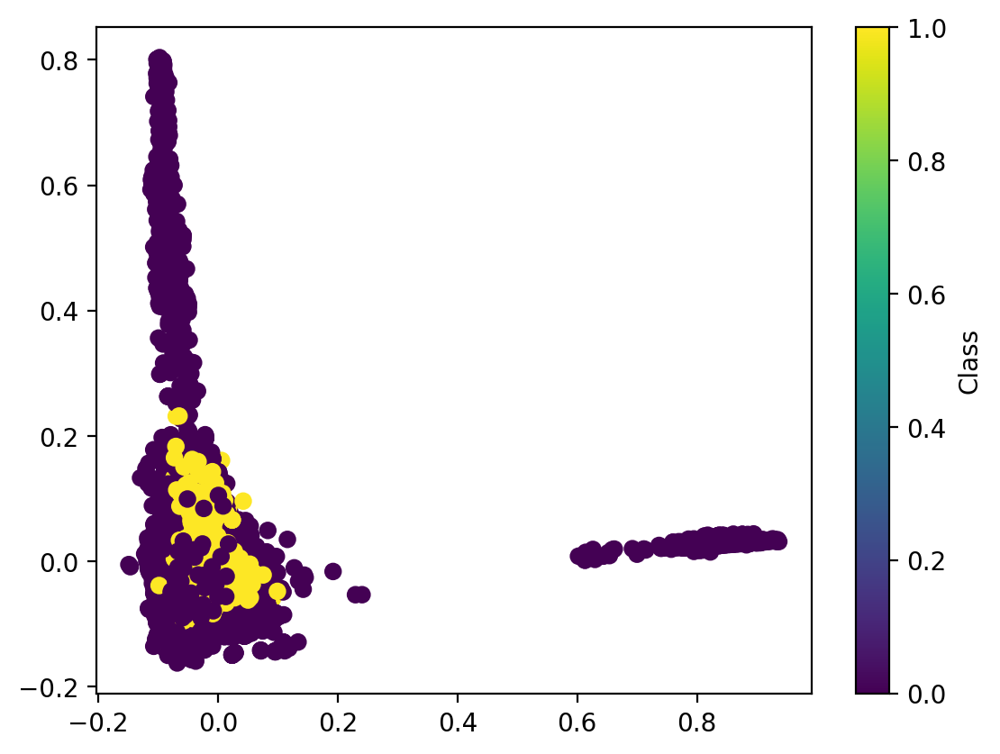

In [29]:
pca_norm = PCA(n_components=3)
X_pca_tfidf = pca_norm.fit_transform(dense_tfidf)
plt.scatter(X_pca_tfidf[:,0], X_pca_tfidf[:,1], c = y)
plt.colorbar(label = 'Class')
plt.show()

No Clear distinction between classes. PCA is not providing good interpretation other than the classes are very identical.

Using the Gaussian Mixture Model to try and cluster:

In [30]:
tfidf_gmm = apply_GMM(X_pca_tfidf, y)
clusters_tfidf = tfidf_gmm[1]

              precision    recall  f1-score   support

           0       0.95      0.96      0.95     17014
           1       0.00      0.00      0.00       866

    accuracy                           0.91     17880
   macro avg       0.47      0.48      0.48     17880
weighted avg       0.90      0.91      0.91     17880



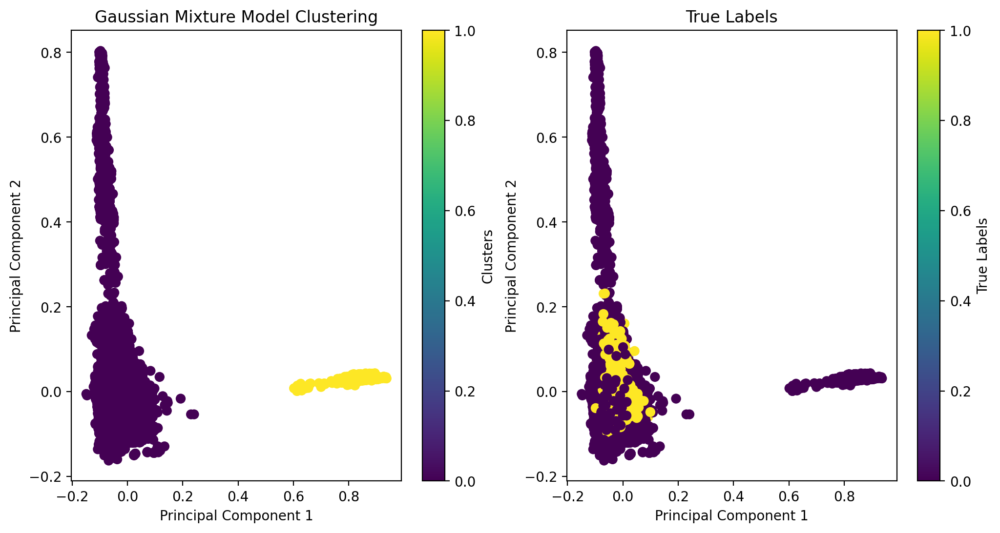

In [32]:
# Create a figure with two subplots, set size for clear visualization
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

# Plot Gaussian Mixture Model Clustering on the first subplot
scatter1 = ax1.scatter(X_pca_tfidf[:, 0], X_pca_tfidf[:, 1], c=clusters_tfidf, s=40, cmap='viridis')
ax1.set_title("Gaussian Mixture Model Clustering")
ax1.set_xlabel('Principal Component 1')
ax1.set_ylabel('Principal Component 2')

# Add a colorbar to the first subplot
fig.colorbar(scatter1, ax=ax1, label='Clusters')

# Plot True Labels on the second subplot
scatter2 = ax2.scatter(X_pca_tfidf[:, 0], X_pca_tfidf[:, 1], c=y, s=40, cmap='viridis')
ax2.set_title("True Labels")
ax2.set_xlabel('Principal Component 1')
ax2.set_ylabel('Principal Component 2')

# Add a colorbar to the second subplot
fig.colorbar(scatter2, ax=ax2, label='True Labels')

# Display the plots
plt.show()

Terrible results since it clusters on data that is not of the Fraudulent class. This happens because it identifies another separate cluster farther from the other combined cluster.

In [ ]:
x_tfidf_non_fraud = X_tfidf[y == 0]  
x_tfidf_fraud = X_tfidf[y == 1]

In [35]:
tfidf_1svm = apply_OneSVM(x_tfidf_non_fraud, x_tfidf_fraud)

Classification Report:
              precision    recall  f1-score   support

         0.0       0.00      1.00      0.00         0
         1.0       1.00      0.32      0.49       866

    accuracy                           0.32       866
   macro avg       0.50      0.66      0.24       866
weighted avg       1.00      0.32      0.49       866



One class SVM is providing better results but still terrible in comparison to the supervised learning models. Most probably because the two classes are too identical and the disbalance does not help in giving more information about the fraud class.

2. For the additional features:

In [36]:
dense_add_tfidf = X_tfidf_add.toarray()

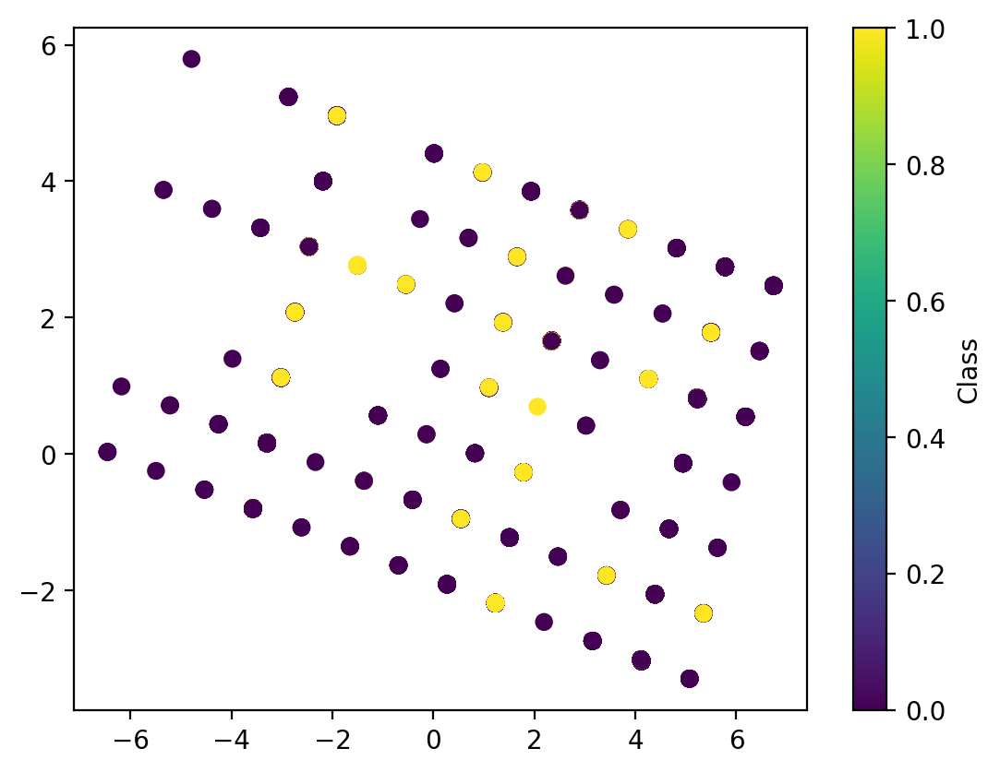

In [37]:
pca_add = PCA(n_components=3)
X_pca_tfidf_add = pca_add.fit_transform(dense_add_tfidf)
plt.scatter(X_pca_tfidf_add[:,0], X_pca_tfidf_add[:,1], c = y)
plt.colorbar(label = 'Class')
plt.show()

In [38]:
tfidf_gmm_add = apply_GMM(X_pca_tfidf_add, y)
clusters_tfidf_add = tfidf_gmm_add[1]

              precision    recall  f1-score   support

           0       0.96      0.47      0.63     17014
           1       0.05      0.59      0.10       866

    accuracy                           0.48     17880
   macro avg       0.51      0.53      0.37     17880
weighted avg       0.91      0.48      0.61     17880



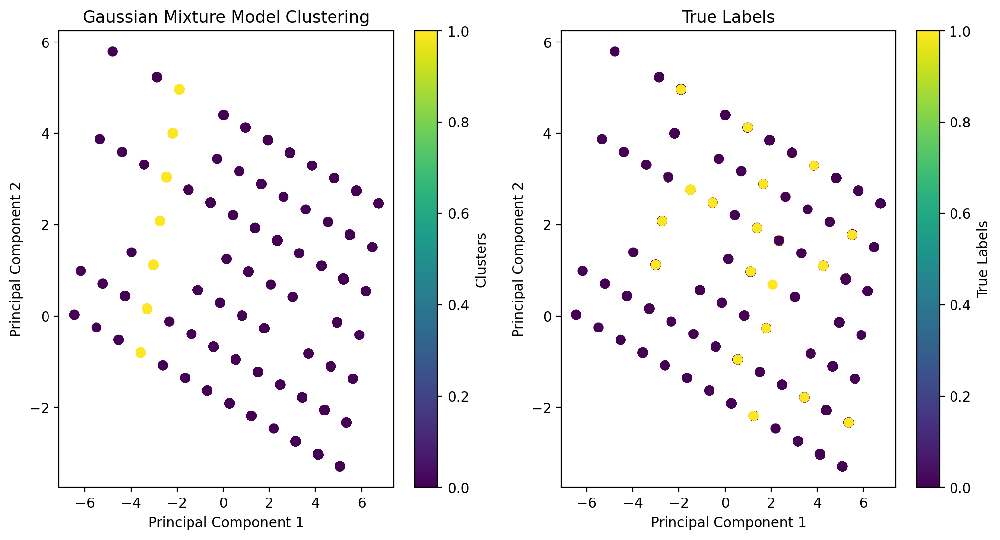

In [39]:
# Create a figure with two subplots, set size for clear visualization
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

# Plot Gaussian Mixture Model Clustering on the first subplot
scatter1 = ax1.scatter(X_pca_tfidf_add[:, 0], X_pca_tfidf_add[:, 1], c=clusters_tfidf_add, s=40, cmap='viridis')
ax1.set_title("Gaussian Mixture Model Clustering")
ax1.set_xlabel('Principal Component 1')
ax1.set_ylabel('Principal Component 2')

# Add a colorbar to the first subplot
fig.colorbar(scatter1, ax=ax1, label='Clusters')

# Plot True Labels on the second subplot
scatter2 = ax2.scatter(X_pca_tfidf_add[:, 0], X_pca_tfidf_add[:, 1], c=y, s=40, cmap='viridis')
ax2.set_title("True Labels")
ax2.set_xlabel('Principal Component 1')
ax2.set_ylabel('Principal Component 2')

# Add a colorbar to the second subplot
fig.colorbar(scatter2, ax=ax2, label='True Labels')

# Display the plots
plt.show()

In [41]:
from scipy.sparse import csr_matrix

In [42]:
# changing the dataframe to a csr matrix for ease of use (issues with string and int names of the columns).
X_tfidf_csr = csr_matrix(X_tfidf_add)

x_tfidf_non_fraud_add = X_tfidf_csr[y == 0]
x_tfidf_fraud_add = X_tfidf_csr[y == 1]

In [44]:
tfidf_1svm = apply_OneSVM(x_tfidf_non_fraud_add, x_tfidf_fraud_add)

Classification Report:
              precision    recall  f1-score   support

         0.0       0.00      1.00      0.00         0
         1.0       1.00      0.07      0.13       866

    accuracy                           0.07       866
   macro avg       0.50      0.53      0.06       866
weighted avg       1.00      0.07      0.13       866



Terrible results once again for the One Class SVM. Additional features were providing more noise.

## Word2Vec

In [45]:
# making the text a list of tokens if it hasnt been done already.
if type(df['text'][0]) != list:
    df['text'] = df['text'].apply(ast.literal_eval)
else:
    print(type(df['text'][0]))

<class 'list'>


In [46]:
from gensim.models import Word2Vec

# gensim model for Word2Vec representation.
model_w2v = Word2Vec(sentences=df['text'], vector_size=200, window=5, sg=1, seed=42)

In [47]:
print(colored('\n============= Word2Vec vocabulary =============', 'blue'))
words = list(model_w2v.wv.key_to_index)
print(words[0:50])


============= Word2Vec vocabulary =============
['work', 'experience', 'team', 'company', 'customer', 'service', 'business', 'skill', 'client', 'product', 'provide', 'year', 'new', 'include', 'ability', 'management', 'development', 'time', 'project', 'job', 'design', 'amp', 'technology', 'environment', 'require', 'opportunity', 'support', 'need', 'look', 'good', 'people', 'sale', 'high', 'help', 'marketing', 'position', 'process', 'knowledge', 'communication', 'strong', 'base', 'grow', 'solution', 'develop', 'build', 'software', 'candidate', 'lead', 'web', 'office']


In [48]:
from gensim.models import KeyedVectors

# Saving the models for later use.
model_w2v.save("model_w2v.model")
word_vectors = model_w2v.wv
word_vectors.save("model_w2v.wordvectors")
wv = KeyedVectors.load("model_w2v.wordvectors", mmap='r')

del model_w2v

In [49]:
# Vocabulary coverage from our model. Not too good.
coverage = get_vocabulary_coverage(wv, D)
print("Vocabulary Coverage: {:.2f}%".format(coverage))

Vocabulary Coverage: 34.25%


In [50]:
vocab = list(word_vectors.key_to_index)
vocab[0:20]

['work',
 'experience',
 'team',
 'company',
 'customer',
 'service',
 'business',
 'skill',
 'client',
 'product',
 'provide',
 'year',
 'new',
 'include',
 'ability',
 'management',
 'development',
 'time',
 'project',
 'job']

In [51]:
wv.most_similar(positive="office")

[('latvia', 0.479246586561203),
 ('cozy', 0.4781133532524109),
 ('coworking', 0.4716722369194031),
 ('hungary', 0.46516743302345276),
 ('sunny', 0.4486902058124542),
 ('offices', 0.4466567039489746),
 ('adminstrative', 0.4424886405467987),
 ('centrally', 0.43799182772636414),
 ('evenly', 0.4376031160354614),
 ('bathurst', 0.43470174074172974)]

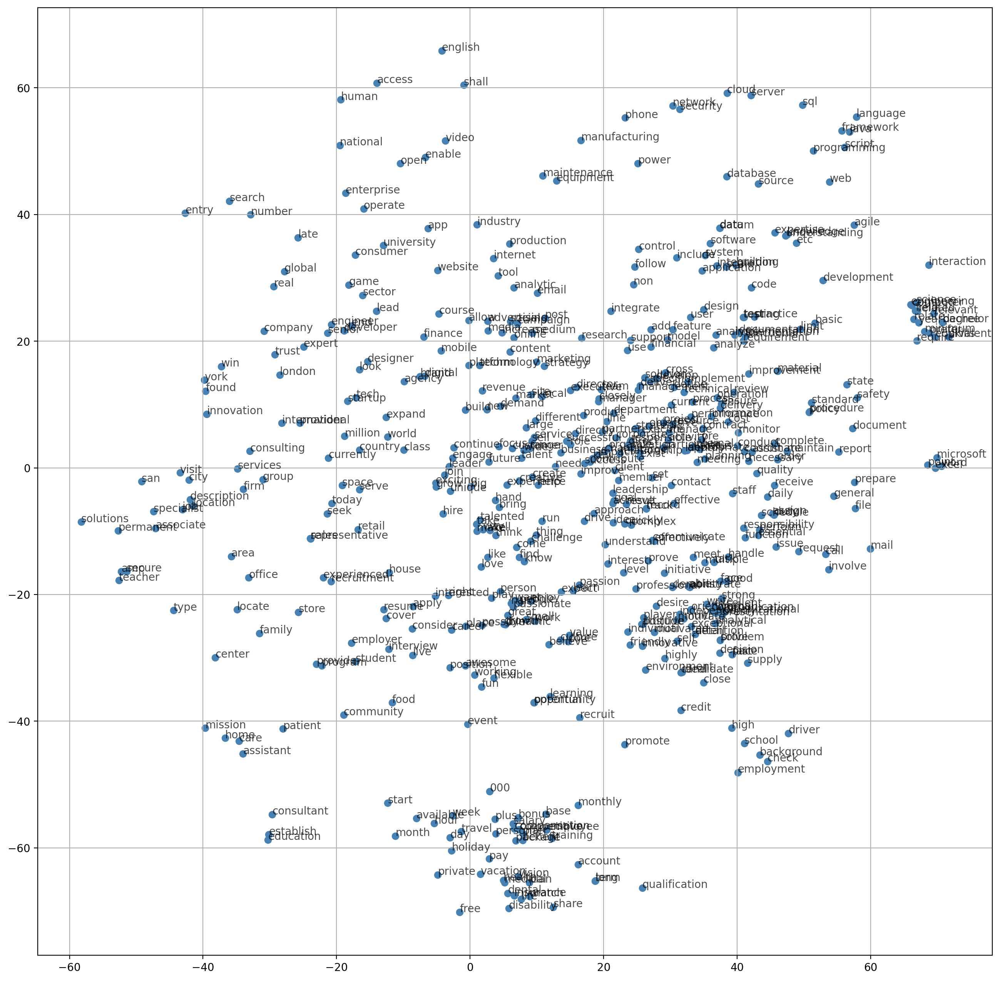

In [89]:
from sklearn.manifold import TSNE

tsne = TSNE(init='random')
embed_tsne = tsne.fit_transform(wv.vectors)

# We plot only 500 embeddings
fig, ax = plt.subplots(figsize=(16, 16))
for idx, word in enumerate((list(wv.key_to_index.keys())[:500])):
    plt.scatter(*embed_tsne[idx, :], color='steelblue')
    plt.annotate(word, (embed_tsne[idx, 0], embed_tsne[idx, 1]), alpha=0.7)
      
plt.grid()

del embed_tsne

Classification using Word2Vec

In [52]:
embedding_vectors = []
for text in df['text']:  # Assuming tokenized_data contains the list of tokenized reviews
    text_vector = get_review_vector(wv, text)
    if text_vector is not None:
        embedding_vectors.append(text_vector)

# Convert embedding vectors to a matrix
embedding_df = pd.DataFrame(embedding_vectors)

combined_df_word2vec = pd.concat([df['fraudulent'], embedding_df], axis=1)

Classification using Word2Vec:

Grid Search CV for the Word2Vec vectorization.

In [53]:
# Splitting the data for y and X.
X_w2v = combined_df_word2vec.drop('fraudulent', axis=1)
y_w2v = combined_df_word2vec['fraudulent']

Using the same procedure as before for the Grid Search CV methods to find the best hyperparameters.

SVC Grid Search

In [54]:
svm_pipeline = Pipeline([
    ('classifier', SVC())
])

svm_param_grid = {
    'classifier__C': [0.1, 1, 10],
    'classifier__gamma': ['scale', 'auto'],
    'classifier__kernel': ['rbf']
}

svm_grid_search = GridSearchCV(svm_pipeline, param_grid=svm_param_grid, cv=3, n_jobs=-1)
svm_grid_search.fit(X_w2v, y_w2v)
print("Best SVM Parameters:", svm_grid_search.best_params_)

Best SVM Parameters: {'classifier__C': 10, 'classifier__gamma': 'scale', 'classifier__kernel': 'rbf'}


Logistic Regression Grid Search

In [57]:
lr_pipeline = Pipeline([
    ('classifier', LogisticRegression(solver='liblinear'))
])

lr_param_grid = {
    'classifier__C': [0.1, 1, 10],
    'classifier__penalty': ['l1', 'l2']
}

lr_grid_search = GridSearchCV(lr_pipeline, param_grid=lr_param_grid, cv=3, n_jobs=-1)
lr_grid_search.fit(X_w2v, y_w2v)
print("Best Logistic Regression Parameters:", lr_grid_search.best_params_)

Best Logistic Regression Parameters: {'classifier__C': 10, 'classifier__penalty': 'l1'}


Random Forest Grid Search

In [58]:
rf_pipeline = Pipeline([
    ('classifier', RandomForestClassifier())
])

rf_param_grid = {
    'classifier__n_estimators': [100, 200, 300],
    'classifier__max_depth': [None, 10, 20]
}

rf_grid_search = GridSearchCV(rf_pipeline, param_grid=rf_param_grid, cv=3, n_jobs=-1)
rf_grid_search.fit(X_w2v, y_w2v)

print("Best Random Forest Parameters:", rf_grid_search.best_params_)

Best Random Forest Parameters: {'classifier__max_depth': None, 'classifier__n_estimators': 100}


In [59]:
# SVM with rbf kernel
w2v_svm = apply_SVM(X_w2v,y_w2v, C = 10, gamma = 'scale')

# logistic regression
w2v_logreg = apply_logregress(X_w2v,y_w2v, C = 10, penalty = 'l1')

# Random Forest
w2v_rf = apply_RandomForestClass(X_w2v,y_w2v, n_estimators = 100, max_depth = None)


Support Vector Machine Classification Report: -------------
              precision    recall  f1-score   support

           0       0.98      1.00      0.99      4247
           1       0.96      0.59      0.73       223

    accuracy                           0.98      4470
   macro avg       0.97      0.80      0.86      4470
weighted avg       0.98      0.98      0.98      4470


Logistic Regression Classification Report: -------------
              precision    recall  f1-score   support

           0       0.96      1.00      0.98      5093
           1       0.87      0.24      0.38       271

    accuracy                           0.96      5364
   macro avg       0.91      0.62      0.68      5364
weighted avg       0.96      0.96      0.95      5364


Random Forest Classifier Classification Report: -------------
              precision    recall  f1-score   support

           0       0.97      1.00      0.98      5093
           1       0.97      0.42      0.59       271



Results still don't improve from the Bag of Words representation. Macro f1 score shows improvement from TF-IDF results.

In [63]:
# Getting the fraud and non fraud rows to use for the SVM
w2v_non_fraud = X_w2v[y_w2v == 0]  
w2v_fraud = X_w2v[y_w2v == 1]

In [64]:
w2v_1svm = apply_OneSVM(w2v_non_fraud,w2v_fraud)

Classification Report:
              precision    recall  f1-score   support

         0.0       0.00      1.00      0.00         0
         1.0       1.00      0.12      0.22       866

    accuracy                           0.12       866
   macro avg       0.50      0.56      0.11       866
weighted avg       1.00      0.12      0.22       866



#### Using PCA

In [65]:
# Using 4 components this time to try and see better insights.
pca_w2v = PCA(n_components=4)

X_pca_w2v  = pca_w2v.fit_transform(X_w2v)

We can try applying the Gaussian Mixture Model again:

In [66]:
w2v_gmm = apply_GMM(X_pca_w2v, y_w2v)
clusters_w2v = w2v_gmm[1]

              precision    recall  f1-score   support

           0       0.95      0.90      0.92     17014
           1       0.02      0.04      0.03       866

    accuracy                           0.86     17880
   macro avg       0.48      0.47      0.48     17880
weighted avg       0.90      0.86      0.88     17880



Bad results for the Gaussian mixture model.

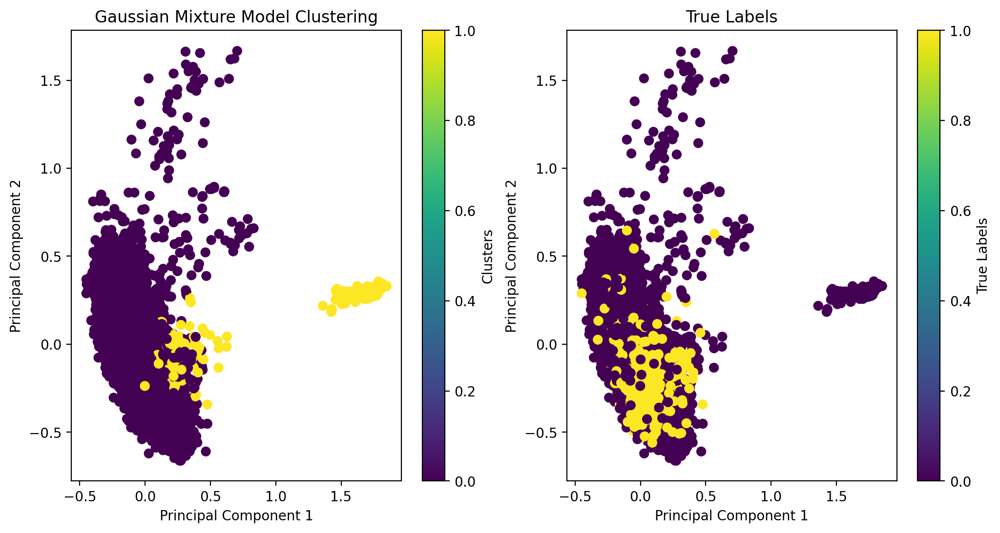

In [67]:
# Create a figure with two subplots, set size for clear visualization
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

# Plot Gaussian Mixture Model Clustering on the first subplot
scatter1 = ax1.scatter(X_pca_w2v[:, 0], X_pca_w2v[:, 1], c=clusters_w2v, s=40, cmap='viridis')
ax1.set_title("Gaussian Mixture Model Clustering")
ax1.set_xlabel('Principal Component 1')
ax1.set_ylabel('Principal Component 2')

# Add a colorbar to the first subplot
fig.colorbar(scatter1, ax=ax1, label='Clusters')

# Plot True Labels on the second subplot
scatter2 = ax2.scatter(X_pca_w2v[:, 0], X_pca_w2v[:, 1], c=y_w2v, s=40, cmap='viridis')
ax2.set_title("True Labels")
ax2.set_xlabel('Principal Component 1')
ax2.set_ylabel('Principal Component 2')

# Add a colorbar to the second subplot
fig.colorbar(scatter2, ax=ax2, label='True Labels')

# Display the plots
plt.show()

Very bad results for the Gaussian mixture model. It has clustered a separate set of points instead of the main 'blob' with points scattered in it. Similar to what happened in the TF-IDF PCA results.

Doing the same but for the additional features:

In [60]:
# Making it a dataframe:
additional_feat_df = pd.DataFrame(additional_feat, columns=['telecommuting', 'required_experience', 'required_education'])

X_w2v_add = pd.concat([X_w2v, additional_feat_df], axis=1)
# Names need to be all int or strings so that they can be compatible with scikit
# Making it a np to simplify.
X_w2v_add_np = X_w2v_add.values

Applying the same models

In [61]:
# SVM with rbf kernel
w2v_svm = apply_SVM(X_w2v_add_np,y_w2v, C = 10, gamma = 'scale')

# logistic regression
w2v_logreg = apply_logregress(X_w2v_add_np,y_w2v, C = 10, penalty = 'l1')

# Random Forest
w2v_rf = apply_RandomForestClass(X_w2v_add_np,y_w2v, n_estimators = 100, max_depth = None)


Support Vector Machine Classification Report: -------------
              precision    recall  f1-score   support

           0       0.96      1.00      0.98      4247
           1       1.00      0.13      0.23       223

    accuracy                           0.96      4470
   macro avg       0.98      0.57      0.60      4470
weighted avg       0.96      0.96      0.94      4470


Logistic Regression Classification Report: -------------
              precision    recall  f1-score   support

           0       0.96      1.00      0.98      5093
           1       0.88      0.26      0.40       271

    accuracy                           0.96      5364
   macro avg       0.92      0.63      0.69      5364
weighted avg       0.96      0.96      0.95      5364


Random Forest Classifier Classification Report: -------------
              precision    recall  f1-score   support

           0       0.97      1.00      0.99      5093
           1       1.00      0.44      0.61       271



Models worsened with new features, showing that they added noise to the models. What also happens is that the class imbalancing does not allow for these features to better describe our fraud class. Therefore, with this dataset they are considered noise.

Applying the unsupervised learning techniques:

In [62]:
# Splitting again the dataset for X and y
w2v_non_fraud_add = X_w2v_add_np[y_w2v == 0]  
w2v_fraud_add = X_w2v_add_np[y_w2v == 1]

In [68]:
w2v_1svm = apply_OneSVM(w2v_non_fraud_add,w2v_fraud_add)

Classification Report:
              precision    recall  f1-score   support

         0.0       0.00      1.00      0.00         0
         1.0       1.00      0.08      0.16       866

    accuracy                           0.08       866
   macro avg       0.50      0.54      0.08       866
weighted avg       1.00      0.08      0.16       866



Poor results for the One Class SVM. Shows that the fraud class is well mixed with the non fraud class.

PCA + GMM

In [69]:
pca_w2v_add = PCA(n_components=3)
X_pca_w2v_add  = pca_w2v_add.fit_transform(X_w2v_add_np)

In [70]:
w2v_gmm_add = apply_GMM(X_pca_w2v_add, y_w2v)
clusters_w2v_add = w2v_gmm_add[1]

              precision    recall  f1-score   support

           0       0.96      0.47      0.63     17014
           1       0.05      0.59      0.10       866

    accuracy                           0.48     17880
   macro avg       0.51      0.53      0.37     17880
weighted avg       0.91      0.48      0.61     17880



No improvement on results since PCA graphs show no trend in the results. They seem like scattered points.

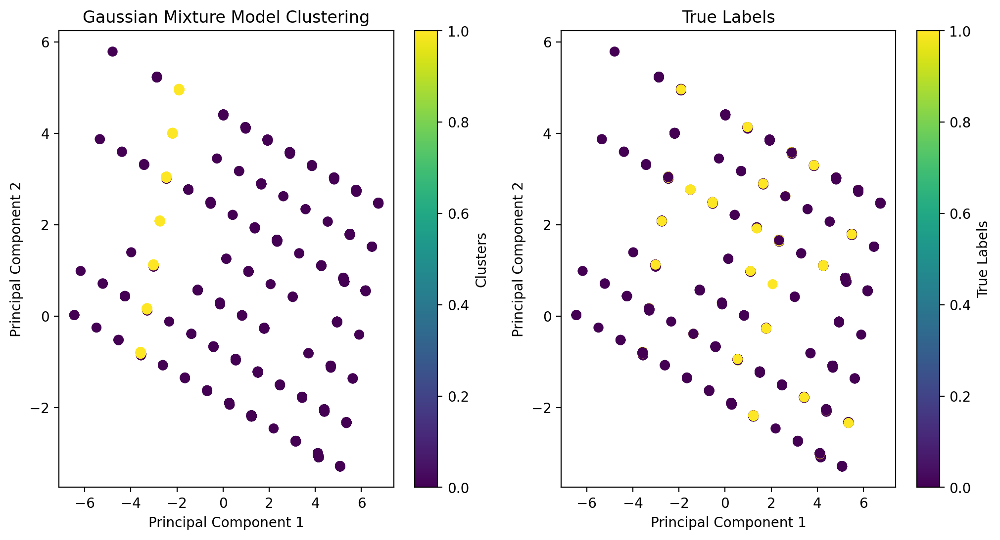

In [71]:
# Create a figure with two subplots, set size for clear visualization
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

# Plot Gaussian Mixture Model Clustering on the first subplot
scatter1 = ax1.scatter(X_pca_w2v_add[:, 0], X_pca_w2v_add[:, 1], c=clusters_w2v_add, s=40, cmap='viridis')
ax1.set_title("Gaussian Mixture Model Clustering")
ax1.set_xlabel('Principal Component 1')
ax1.set_ylabel('Principal Component 2')

# Add a colorbar to the first subplot
fig.colorbar(scatter1, ax=ax1, label='Clusters')

# Plot True Labels on the second subplot
scatter2 = ax2.scatter(X_pca_w2v_add[:, 0], X_pca_w2v_add[:, 1], c=y_w2v, s=40, cmap='viridis')
ax2.set_title("True Labels")
ax2.set_xlabel('Principal Component 1')
ax2.set_ylabel('Principal Component 2')

# Add a colorbar to the second subplot
fig.colorbar(scatter2, ax=ax2, label='True Labels')

# Display the plots
plt.show()

Not much insight into our PCA represented data. This means that the additional features being added to the data is really only adding noise to our Word2Vec representation of the text.

## GloVe

In [72]:
from gensim import downloader

# Using the wikipedia trained model that already exists.
glove = downloader.load('glove-wiki-gigaword-50')

In [73]:
# It covers the entirety of the vocabulary.
get_vocabulary_coverage(glove,D)

100.0

In [74]:
embedding_vectors = []
for text in df['text']:  # Assuming tokenized_data contains the list of tokenized reviews
    text_vector = get_review_vector(glove, text)
    if text_vector is not None:
        embedding_vectors.append(text_vector)

# Convert embedding vectors to a matrix
embedding_df = pd.DataFrame(embedding_vectors)

combined_df_glove = pd.concat([df['fraudulent'], embedding_df], axis=1)

In [75]:
X_gl = combined_df_glove.drop('fraudulent', axis=1)
y_gl = combined_df_glove['fraudulent']

Applying the same procedures as before but with the GloVe representation.

Classification using GloVe

In [76]:
svm_pipeline = Pipeline([
    ('classifier', SVC())
])

svm_param_grid = {
    'classifier__C': [0.1, 1, 10],
    'classifier__gamma': ['scale', 'auto'],
    'classifier__kernel': ['rbf']
}

svm_grid_search = GridSearchCV(svm_pipeline, param_grid=svm_param_grid, cv=3, n_jobs=-1)
svm_grid_search.fit(X_gl, y_gl)
print("Best SVM Parameters:", svm_grid_search.best_params_)

Best SVM Parameters: {'classifier__C': 10, 'classifier__gamma': 'scale', 'classifier__kernel': 'rbf'}


In [77]:
lr_pipeline = Pipeline([
    ('classifier', LogisticRegression(solver='liblinear'))
])

lr_param_grid = {
    'classifier__C': [0.1, 1, 10],
    'classifier__penalty': ['l1', 'l2']
}

lr_grid_search = GridSearchCV(lr_pipeline, param_grid=lr_param_grid, cv=3, n_jobs=-1)
lr_grid_search.fit(X_gl, y_gl)
print("Best Logistic Regression Parameters:", lr_grid_search.best_params_)

Best Logistic Regression Parameters: {'classifier__C': 10, 'classifier__penalty': 'l1'}


In [78]:
rf_pipeline = Pipeline([
    ('classifier', RandomForestClassifier())
])

rf_param_grid = {
    'classifier__n_estimators': [100, 200, 300],
    'classifier__max_depth': [None, 10, 20]
}

rf_grid_search = GridSearchCV(rf_pipeline, param_grid=rf_param_grid, cv=3, n_jobs=-1)
rf_grid_search.fit(X_gl, y_gl)

print("Best Random Forest Parameters:", rf_grid_search.best_params_)

Best Random Forest Parameters: {'classifier__max_depth': None, 'classifier__n_estimators': 300}


In [79]:
X_gl

,0,1,2,3,4,5,6,7,8,9,...,40,41,42,43,44,45,46,47,48,49
0,0.145529,0.220067,-0.025156,0.058287,0.169448,-0.064109,-0.589435,-0.217730,0.103203,0.050535,...,0.100331,0.001665,-0.118945,0.115177,0.043877,0.110055,-0.062956,0.165797,0.006020,0.318056
1,0.213983,0.138238,0.166727,0.144587,0.124461,-0.062474,-0.437443,-0.295628,0.297640,0.238899,...,0.109190,-0.116993,-0.027011,0.031513,-0.032848,0.006144,0.094391,0.139561,-0.035078,0.253480
2,0.172206,0.000677,-0.004721,0.055627,0.179042,-0.064806,-0.251299,-0.085941,0.419002,-0.064542,...,-0.063994,-0.250717,0.125724,0.110662,-0.087888,-0.168500,-0.078388,0.488921,0.034510,0.313738
3,0.215462,0.148473,0.050995,0.054795,0.193363,-0.031093,-0.266290,-0.333673,0.237513,0.134992,...,-0.094301,-0.268373,0.105583,0.230043,-0.059713,-0.009766,0.074578,0.396388,0.028512,0.254428
4,0.144314,0.074590,-0.025711,0.023297,0.097800,-0.059841,-0.255582,-0.189128,0.393331,-0.074367,...,-0.097946,-0.217425,0.091344,0.251060,-0.157677,-0.125040,0.024495,0.552346,-0.006403,0.416664
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17875,0.207892,0.178634,0.005523,0.027225,0.300525,-0.096079,-0.467120,-0.172382,0.091461,0.079594,...,-0.030624,-0.108374,0.010037,0.164130,0.028229,0.089122,-0.062472,0.055193,-0.033458,0.240423
17876,0.161713,0.055923,0.132905,0.001065,0.163197,0.032370,-0.313169,-0.285986,0.263262,0.104912,...,-0.010060,-0.175244,0.047819,0.332959,-0.116001,-0.104674,0.049619,0.352720,0.027075,0.331580
17877,0.329264,0.083709,0.117620,0.010168,0.109785,0.005262,-0.253196,-0.248692,0.301793,-0.042082,...,-0.044609,-0.240681,0.098918,0.239340,-0.149686,-0.119321,0.082444,0.568868,0.033146,0.316479
17878,0.150349,0.148323,-0.098967,-0.018578,0.176209,-0.043451,-0.330590,-0.326019,-0.129488,0.281495,...,0.168093,-0.052472,-0.057172,0.093803,0.033746,0.023400,0.246254,0.132008,-0.078504,0.316273


In [83]:
# Train SVM
gl_svm = apply_SVM(X_gl, y_gl,C = 10, gamma='scale')

# Train Logistic regressor
gl_lr = apply_logregress(X_gl, y_gl, C = 10 , penalty = 'l1')

# Random Forest:
gl_lr = apply_RandomForestClass(X_gl, y_gl, n_estimators = 300, max_depth = None)


Support Vector Machine Classification Report: -------------
              precision    recall  f1-score   support

           0       0.96      1.00      0.98      4247
           1       1.00      0.12      0.21       223

    accuracy                           0.96      4470
   macro avg       0.98      0.56      0.59      4470
weighted avg       0.96      0.96      0.94      4470


Logistic Regression Classification Report: -------------
              precision    recall  f1-score   support

           0       0.95      1.00      0.98      5093
           1       0.93      0.05      0.10       271

    accuracy                           0.95      5364
   macro avg       0.94      0.53      0.54      5364
weighted avg       0.95      0.95      0.93      5364


Random Forest Classifier Classification Report: -------------
              precision    recall  f1-score   support

           0       0.97      1.00      0.98      5093
           1       0.99      0.40      0.57       271



Worst results out of all the representations except for the Random Forest Classifier. Shows a macro f1-score of 0.78 but is still not better than the logistic regression model or the SVM model. It is also a more complex model which means that the other more simple ones are favourable.

One Class SVM:

In [81]:
# Splitting the dataset once again for OneSVM.
gl_non_fraud = X_gl[y_gl == 0]  
gl_fraud = X_gl[y_gl == 1]

In [84]:
gl_1svm = apply_OneSVM(gl_non_fraud,gl_fraud)

Classification Report:
              precision    recall  f1-score   support

         0.0       0.00      1.00      0.00         0
         1.0       1.00      0.21      0.35       866

    accuracy                           0.21       866
   macro avg       0.50      0.60      0.17       866
weighted avg       1.00      0.21      0.35       866



Poor results once again. One Class SVM is not appropriate for this classification task given the imbalancing.

PCA + GMM

Using 3 components since 4 did not give any additional information.

In [85]:
pca_gl = PCA(n_components=3)
X_pca_gl  = pca_gl.fit_transform(X_gl)

In [86]:
gl_gmm = apply_GMM(X_pca_gl, y_gl)
clusters_gl = gl_gmm[1]

              precision    recall  f1-score   support

           0       0.97      0.02      0.04     17014
           1       0.05      0.99      0.09       866

    accuracy                           0.07     17880
   macro avg       0.51      0.50      0.07     17880
weighted avg       0.93      0.07      0.04     17880



Recall has improved to 0.99,but we have a very low macro f1-score. This means we have a large amount of True positives for the one class but a low amount of true positives for the 0 class. Also false negatives are very high.

Plotting the results of the GMM and PCA.

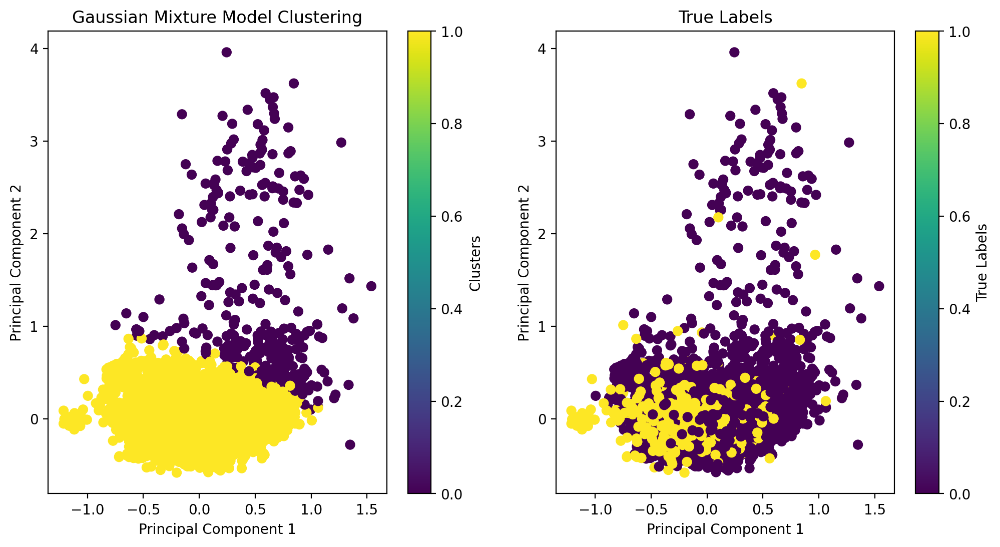

In [87]:
# Create a figure with two subplots, set size for clear visualization
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

# Plot Gaussian Mixture Model Clustering on the first subplot
scatter1 = ax1.scatter(X_pca_gl[:, 0], X_pca_gl[:, 1], c=clusters_gl, s=40, cmap='viridis')
ax1.set_title("Gaussian Mixture Model Clustering")
ax1.set_xlabel('Principal Component 1')
ax1.set_ylabel('Principal Component 2')

# Add a colorbar to the first subplot
fig.colorbar(scatter1, ax=ax1, label='Clusters')

# Plot True Labels on the second subplot
scatter2 = ax2.scatter(X_pca_gl[:, 0], X_pca_gl[:, 1], c=y_gl, s=40, cmap='viridis')
ax2.set_title("True Labels")
ax2.set_xlabel('Principal Component 1')
ax2.set_ylabel('Principal Component 2')

# Add a colorbar to the second subplot
fig.colorbar(scatter2, ax=ax2, label='True Labels')

# Display the plots
plt.show()

Clearly we are overcompensating for the 1 class, showing unusable results for the classification of the fraud class. This is because we would classify too many non fraud cases as fraudulent ones.

Additional Features:

In [88]:
additional_feat_df = pd.DataFrame(additional_feat, columns=['telecommuting', 'required_experience', 'required_education'])

X_gl_add = pd.concat([X_gl, additional_feat_df], axis=1)

In [91]:
# Making sure there are no problems with models (does not accept str and int combination of 
# column names)
X_gl_add = X_gl_add.to_numpy()

In [92]:
# Train SVM
gl_svm = apply_SVM(X_gl_add, y_gl,C = 10, gamma='scale')

# Train Logistic regressor
gl_lr = apply_logregress(X_gl_add, y_gl, C = 10 , penalty = 'l1')

# Random Forest:
gl_lr = apply_RandomForestClass(X_gl_add, y_gl, n_estimators = 300, max_depth = None)

c:\Users\Ricardo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Ricardo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Ricardo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(av


Support Vector Machine Classification Report: -------------
              precision    recall  f1-score   support

           0       0.95      1.00      0.97      4247
           1       0.00      0.00      0.00       223

    accuracy                           0.95      4470
   macro avg       0.48      0.50      0.49      4470
weighted avg       0.90      0.95      0.93      4470


Logistic Regression Classification Report: -------------
              precision    recall  f1-score   support

           0       0.95      1.00      0.98      5093
           1       0.95      0.07      0.13       271

    accuracy                           0.95      5364
   macro avg       0.95      0.53      0.55      5364
weighted avg       0.95      0.95      0.93      5364


Random Forest Classifier Classification Report: -------------
              precision    recall  f1-score   support

           0       0.97      1.00      0.98      5093
           1       0.99      0.38      0.55       271



Terrible results for the SVM showing that it did not classify the 1 class at all (ill defined F score and precision.) No improvements on the Logistic Regression nor Random Forest Classifier.

In [93]:
# Splitting the data
gl_non_fraud_add = X_gl_add[y_gl == 0]  
gl_fraud_add = X_gl_add[y_gl == 1]

One class svm on the additional feature data frame

In [94]:
gl_1svm = apply_OneSVM(gl_non_fraud_add,gl_fraud_add)

Classification Report:
              precision    recall  f1-score   support

         0.0       0.00      1.00      0.00         0
         1.0       1.00      0.12      0.21       866

    accuracy                           0.12       866
   macro avg       0.50      0.56      0.11       866
weighted avg       1.00      0.12      0.21       866



Poor results again (worsening with extra features).

PCA + GMM

Applying the same procedures as before. PCA is set with 3 components

In [95]:
pca_gl_add = PCA(n_components=3)
X_pca_gl_add  = pca_gl_add.fit_transform(X_gl_add)

In [96]:
gl_gmm_add = apply_GMM(X_pca_gl_add, y_gl)
clusters_gl_add = gl_gmm_add[1]

              precision    recall  f1-score   support

           0       0.96      0.47      0.63     17014
           1       0.05      0.59      0.10       866

    accuracy                           0.48     17880
   macro avg       0.51      0.53      0.37     17880
weighted avg       0.91      0.48      0.61     17880



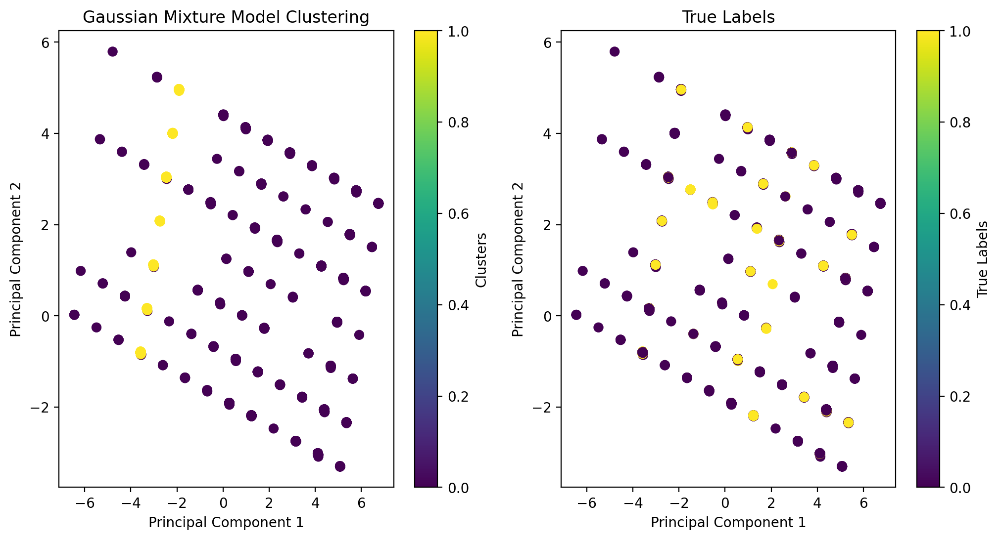

In [97]:
# Create a figure with two subplots, set size for clear visualization
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

# Plot Gaussian Mixture Model Clustering on the first subplot
scatter1 = ax1.scatter(X_pca_gl_add[:, 0], X_pca_gl_add[:, 1], c=clusters_gl_add, s=40, cmap='viridis')
ax1.set_title("Gaussian Mixture Model Clustering")
ax1.set_xlabel('Principal Component 1')
ax1.set_ylabel('Principal Component 2')

# Add a colorbar to the first subplot
fig.colorbar(scatter1, ax=ax1, label='Clusters')

# Plot True Labels on the second subplot
scatter2 = ax2.scatter(X_pca_gl_add[:, 0], X_pca_gl_add[:, 1], c=y_gl, s=40, cmap='viridis')
ax2.set_title("True Labels")
ax2.set_xlabel('Principal Component 1')
ax2.set_ylabel('Principal Component 2')

# Add a colorbar to the second subplot
fig.colorbar(scatter2, ax=ax2, label='True Labels')

# Display the plots
plt.show()

The PCA representation does not tell us much about our data. It also is not clear on how to cluster 2 groups of components together since there is no separation between the two classes (they are mixed together). Therefore, the Gaussian Mixure model presents with low macro F1 score and low recall for the positive class.

# Topic Modeling

In [17]:
import random
df_loaded = pd.read_pickle('tokenized.pkl') # tokenized NLP text df
df_loaded
random.seed(42)

In [18]:
from gensim.models.ldamodel import LdaModel
from gensim import corpora


D = corpora.Dictionary(df_loaded['text'])

corpus = [D.doc2bow(text) for text in df_loaded['text']]

# Create benchmark LDA model
num_topics = 25
ldag = LdaModel(corpus=corpus, id2word=D, num_topics=num_topics)

In [ ]:
ldag.show_topics(num_topics=-1, num_words=10, log=False, formatted=True)

[(0,
  '0.031*"customer" + 0.014*"process" + 0.014*"service" + 0.014*"work" + 0.014*"team" + 0.012*"business" + 0.012*"require" + 0.011*"communication" + 0.011*"company" + 0.011*"mail"'),
 (1,
  '0.016*"client" + 0.011*"team" + 0.010*"management" + 0.009*"work" + 0.009*"plan" + 0.008*"service" + 0.008*"experience" + 0.007*"manager" + 0.007*"employee" + 0.007*"business"'),
 (2,
  '0.017*"customer" + 0.012*"service" + 0.012*"experience" + 0.011*"business" + 0.010*"work" + 0.010*"management" + 0.009*"product" + 0.008*"skill" + 0.008*"client" + 0.008*"provide"'),
 (3,
  '0.028*"work" + 0.018*"team" + 0.013*"people" + 0.012*"look" + 0.010*"want" + 0.009*"experience" + 0.009*"great" + 0.008*"new" + 0.008*"grow" + 0.008*"company"'),
 (4,
  '0.020*"design" + 0.019*"experience" + 0.016*"team" + 0.015*"work" + 0.015*"product" + 0.013*"web" + 0.012*"development" + 0.009*"software" + 0.008*"build" + 0.008*"technology"'),
 (5,
  '0.022*"student" + 0.014*"intern" + 0.012*"internship" + 0.012*"work" 

Coherence analysis

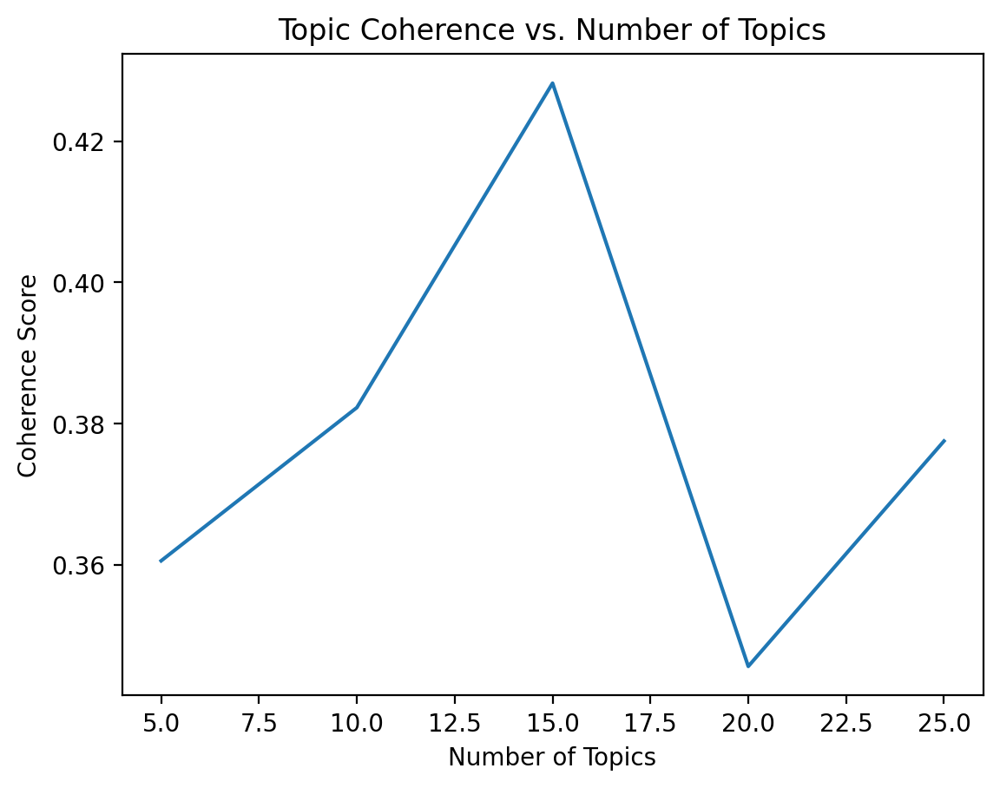

In [ ]:
from gensim.models import CoherenceModel
import matplotlib.pyplot as plt

n_topics = [5, 10, 15, 20, 25]
coherence_values = []

# Iterate over different numbers of topics
for num_topics in n_topics:
    # Train your LDA model with the current number of topics
    lda_model = LdaModel(corpus=corpus, id2word=D, num_topics=num_topics)

    # Compute coherence for the trained model
    coherencemodel = CoherenceModel(model=lda_model, texts=df_loaded['text'], dictionary=D, coherence='c_v')
    coherence_score = coherencemodel.get_coherence()

    coherence_values.append(coherence_score)

plt.plot(n_topics, coherence_values)
plt.xlabel("Number of Topics")
plt.ylabel("Coherence Score")
plt.title("Topic Coherence vs. Number of Topics")
plt.show()

Through this coherence analysis and the interpretable analysis through the topics, we define that the number of topics to take is 10.

In [19]:
from gensim.models.ldamodel import LdaModel
from gensim import corpora

D = corpora.Dictionary(df_loaded['text'])

corpus = [D.doc2bow(text) for text in df_loaded['text']]

# Create Definitive LDA model
num_topics = 10
ldag = LdaModel(corpus=corpus, id2word=D, num_topics=num_topics)

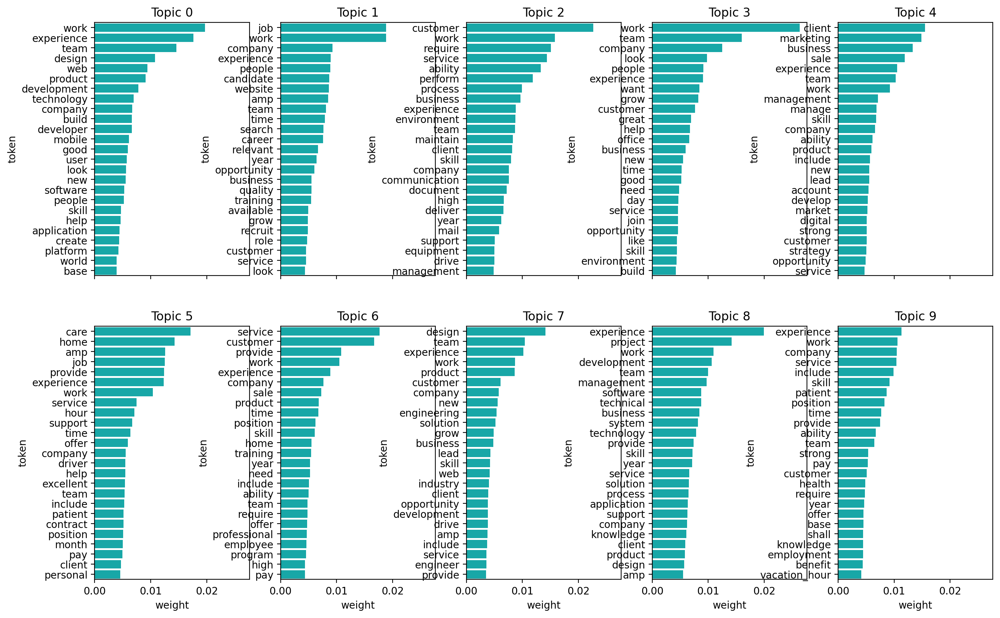

In [ ]:
topn = 25

fig, axes = plt.subplots(2, 5, figsize=(16, 10), sharex=True)

for i in range(5):
    df = pd.DataFrame(ldag.show_topic(i, topn), columns=['token', 'weight'])
    sns.barplot(x='weight', y='token', data=df, color='c', orient='h', ax=axes[0][i])
    axes[0][i].set_title('Topic ' + str(i))

for i in range(5, 10):
    df = pd.DataFrame(ldag.show_topic(i, topn), columns=['token', 'weight'])
    sns.barplot(x='weight', y='token', data=df, color='c', orient='h', ax=axes[1][i-5])
    axes[1][i-5].set_title('Topic ' + str(i))

plt.show()

Analysis on LDA topic Modeling.

In [ ]:
# !pip install pyLDAvis==3.4.1
import pyLDAvis.gensim as gensimvis
import pyLDAvis

vis_data = gensimvis.prepare(ldag, corpus, D)
pyLDAvis.display(vis_data)

In [14]:
def most_relevant_documents(ldag, topicid, corpus_bow, texts, ndocs=10):
    """This function returns the most relevant documents' texts in corpus_bow
    """

    print('Computing most relevant documents for Topic', topicid)
    print('Topic composition is:')
    print(ldag.show_topic(topicid))

    from operator import itemgetter

    # Get the distribution of topics for each document
    topic_dist = ldag.get_document_topics(corpus_bow, per_word_topics=False)

    # Find the documents where the current topic has the highest contribution
    relevant_docs = [(doc_id, prob) for doc_id, topics in enumerate(topic_dist)
                     for topic, prob in topics if topic == topicid]
    relevant_docs.sort(key=itemgetter(1), reverse=True)

    # Extract texts of the top relevant documents
    top_texts = [texts[doc_id] for doc_id, _ in relevant_docs[:ndocs]]
    return top_texts

In [ ]:
# with raw text
project_texts = most_relevant_documents(ldag, 3, corpus, df['text'], ndocs=3)
for text in project_texts:
    print("\n", text)

Computing most relevant documents for Topic 3
Topic composition is:
[('work', 0.026329968), ('team', 0.015993783), ('company', 0.012525326), ('look', 0.00978277), ('people', 0.009108503), ('experience', 0.009061568), ('want', 0.008445655), ('grow', 0.008242399), ('customer', 0.0076508815), ('great', 0.0069513787)]

 Happiness Recruiter US, CA, Santa Monica We’re always looking for highly motivated “founder-types” to join us as we grow. Here’s what you need to know.Our Core Values:Every member of our team brings something unique to the table, but we share the same values:Use your intelligence without arroganceTake initiative, and execute tenaciouslyPut the team’s needs above your ownRespect customers, partners, investors, and co-workersFocus on results, but never compromise on qualityLive to learn, and share what you discoverBe honest, be transparent, and be goodNever, ever give up!Things to Consider:1. We are hiring for entrepreneurial positions, at an entrepreneurial company. This mea

Similar job description however, different position and location for the most relevant documents of the topic

## DASH

Topic Distribution df and keywords

In [ ]:
from gensim.models import LdaModel
from gensim import corpora
import pandas as pd

df_loaded=pd.read_csv('preprocessed_df.csv')
import ast
if type(df_loaded['text'][0]) != list:
    df_loaded['text'] = df_loaded['text'].apply(ast.literal_eval) # To tokenize the csv
else:
    print(type(df['text'][0]))


dictionary = corpora.Dictionary(df_loaded['text'])
corpus = [dictionary.doc2bow(text) for text in df_loaded['text']]

# Create or load an LDA model
num_topics = 10  # Adjust based on your model's topic count
ldag = LdaModel(corpus=corpus, id2word=dictionary, num_topics=num_topics)

# Extract top 5 words for each topic
topic_keywords = {}
num_top_words = 5
for i in range(num_topics):
    words = ldag.show_topic(i, topn=num_top_words)
    topic_keywords[i] = ', '.join([word for word, prob in words])

# Function to extract topic probabilities
def extract_topic_probs(lda_model, corpus, num_topics):
    topic_probs = []
    for doc_bow in corpus:
        doc_topics = lda_model.get_document_topics(doc_bow, minimum_probability=0)
        full_probs = [0] * num_topics
        for topic, prob in doc_topics:
            full_probs[topic] = prob
        topic_probs.append(full_probs)
    return topic_probs

# Generate a DataFrame with topic distributions
df_docs = pd.DataFrame({
    'Document_ID': range(1, len(df_loaded)+1),
    'Topic_Prob_Dist': extract_topic_probs(ldag, corpus, num_topics),
    'text': df_loaded['text'],
    'fraudulent': df_loaded['fraudulent']
})

In [ ]:
import pickle
df_docs.to_pickle('df_docs.pkl') 
pickle.dump(topic_keywords, open('topic_keywords.pkl', 'wb'))

Models results dataframe

In [ ]:
import pandas as pd

data = {
    'Model': ['Random Forest', 'Logistic Regression', 'SVM', 'One Class SVM', 'PCA + GMM', 
              'Random Forest', 'Logistic Regression', 'SVM', 
              'Random Forest', 'Logistic Regression', 'SVM', 'One Class SVM', 'PCA + GMM',
              'Random Forest', 'Logistic Regression', 'SVM', 'One Class SVM', 'PCA + GMM',
              'Random Forest', 'Logistic Regression', 'SVM', 'One Class SVM', 'PCA + GMM'],
    'Vectorization': ['Bag of Words', 'Bag of Words', 'Bag of Words', 'Bag of Words', 'Bag of Words',
                      'Bag of Words with SMOTE', 'Bag of Words with SMOTE', 'Bag of Words with SMOTE', 
                      'TF-IDF', 'TF-IDF', 'TF-IDF', 'TF-IDF', 'TF-IDF',
                      'Word2Vec', 'Word2Vec', 'Word2Vec', 'Word2Vec', 'Word2Vec',
                      'GloVe', 'GloVe', 'GloVe', 'GloVe', 'GloVe'],
    'C0_recall': [1.00, 1.00, 1.00, 1.00, 0.59, 0.93, 0.98, 0.99, 1.00, 1, 1, 1, 0.47, 1, 1, 1, 1, 0.47, 1, 1, 1, 1, 0.47],
    'C1_recall': [0.58, 0.72, 0.72, 0.09, 0.24, 0.81, 0.79, 0.73, 0.59, 0.40, 0.48, 0.07, 0.59, 0.44, 0.26, 0.13, 0.08, 0.59, 0.38, 0.07, 0.00, 0.12, 0.59],
    'Macro_F1_Score': [0.86, 0.90, 0.90, 0.09, 0.39, 0.74, 0.84, 0.86, 0.87, 0.78, 0.82, 0.06, 0.37, 0.8, 0.6, 0.6, 0.08, 0.37, 0.77, 0.55, 0.49, 0.11, 0.37]
}

df = pd.DataFrame(data)
df.to_csv('results_dash.csv', index=False)

T-sne csv file and word2vec model

In [ ]:
import pandas as pd
from gensim.models import Word2Vec
from sklearn.manifold import TSNE

model = Word2Vec.load("model_w2v.model")
wv = model.wv
tsne = TSNE(init='random', random_state=42)
embed_tsne = tsne.fit_transform(wv.vectors[:500])  # Limit to first 500 words for performance
words = list(wv.key_to_index.keys())[:500]
df_tsne = pd.DataFrame(embed_tsne, columns=['x', 'y'])
df_tsne['word'] = words

In [ ]:
df_tsne.to_csv('df_tsne.csv', index=False)